In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
bac_dataset = "/Users/pawanpahune/AI_Pipeline_Metagenomics/data/Rodriguez/2024-03-12_taxa_abundances_bacteria_bpo2117.xlsx"
fun_dataset = "/Users/pawanpahune/AI_Pipeline_Metagenomics/data/Rodriguez/2024-03-12_taxa_abundances_fungi_bpo2117.xlsx"
metadata = "/Users/pawanpahune/AI_Pipeline_Metagenomics/data/Rodriguez/Muestras Biome Makers.xlsx"

In [4]:
import pandas as pd

# Define the file paths
metadata_path = "/Users/pawanpahune/AI_Pipeline_Metagenomics/data/Rodriguez/Muestras Biome Makers.xlsx"
bac_abund_path = "/Users/pawanpahune/AI_Pipeline_Metagenomics/data/Rodriguez/2024-03-12_taxa_abundances_bacteria_bpo2117.xlsx"
fun_abund_path = "/Users/pawanpahune/AI_Pipeline_Metagenomics/data/Rodriguez/2024-03-12_taxa_abundances_fungi_bpo2117.xlsx"

# 1. Load the Metadata
metadata_df = pd.read_excel(metadata_path, skiprows=9)

# 2. Load the Bacteria and Fungi Abundance data
bac_abund_df = pd.read_excel(bac_abund_path)
fun_abund_df = pd.read_excel(fun_abund_path)

# 3. Load the References (if references are in separate sheets)
bac_ref_df = pd.read_excel(bac_abund_path, sheet_name='references')
fun_ref_df = pd.read_excel(fun_abund_path, sheet_name='references')

# --- Showing Top 10 Columns ---
print("Metadata Top 10 Columns:")
print(metadata_df.columns[:10].tolist())

print("\nBacteria Abundance Top 10 Columns:")
print(bac_abund_df.columns[:10].tolist())

# --- Showing Top 10 Rows (of Metadata as an example) ---
print("\nMetadata Top 10 Rows:")
print(metadata_df.head(10))

Metadata Top 10 Columns:
['Código', 'Nombre de muestra', 'Fecha de \nrecolección', 'Nombre de parcela', 'Cultivo', 'Ciudad', 'País', 'Grados Minutos Segundos (DMS) \no Grados Decimales (DD)', 'Variedad', 'Densidad\n(plantas/hectarea)']

Bacteria Abundance Top 10 Columns:
['taxonomy [%]', 'taxa [%]', 'AZM03Y', 'AZM03Z', 'AZM040', 'AZM041', 'AZM042', 'AZM043', 'AZM044', 'AZM045']

Metadata Top 10 Rows:
   Código Nombre de muestra Fecha de \nrecolección Nombre de parcela  \
0  AZM03Y       H3-N 2 Rice             2024-01-30              H3-N   
1  AZM03Z        E1 2 Beans             2024-01-30                E1   
2  AZM040     P3 5 Forrajes             2024-01-29                P3   
3  AZM041      L1-N 1 Beans             2024-01-29              L1-N   
4  AZM042       I1-S 3 Rice             2024-01-30              I1-S   
5  AZM043     P3 2 Forrajes             2024-01-29                P3   
6  AZM044    N1-N 1 Cassava             2024-01-29              N1-N   
7  AZM045   N3 F 1 F

In [5]:
bac_abund_df

,taxonomy [%],taxa [%],AZM03Y,AZM03Z,AZM040,AZM041,AZM042,AZM043,AZM044,AZM045,...,AZM05O,AZM05P,AZM05Q,AZM05R,AZM05S,AZM05T,AZM05U,AZM05V,AZM05W,AZM05X
0,Archaea;Crenarchaeota;Nitrososphaeria;Nitrosos...,Nitrososphaera viennensis,0.000000,0.165605,0.000000,0.268817,0.060505,0.007970,0.162602,0.000000,...,0.054412,0.050684,0.097136,0.096100,0.139513,0.000000,0.000000,0.000000,0.000000,0.129542
1,Archaea;Crenarchaeota;Nitrososphaeria;Nitrosos...,Nitrosocosmicus oleophilus,0.712889,0.949045,0.040298,0.658705,0.423534,0.037194,0.137965,0.000000,...,0.300867,0.317327,0.133113,0.459607,1.153771,0.246532,0.095621,1.408688,0.253275,0.500604
2,Archaea;Crenarchaeota;Nitrososphaeria;Nitrosos...,Nitrosocosmicus sp.,8.801324,1.269639,6.835090,3.324304,7.475485,4.875133,5.622074,0.041109,...,13.788689,11.126292,14.437329,3.992312,16.030023,5.345484,13.821580,13.819461,16.613537,9.452190
3,Archaea;Crenarchaeota;Nitrososphaeria;Nitrosos...,Nitrososphaera sp.,12.938788,6.800425,12.021079,14.922433,11.074484,10.706695,17.925597,0.111581,...,13.334187,12.937702,15.901569,14.001295,8.003851,12.416689,7.243290,12.935082,9.558952,14.146449
4,Archaea;Euryarchaeota;Methanobacteria;Methanob...,Methanobacterium movilense,0.000000,0.000000,0.027898,0.000000,0.000000,0.013284,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1784,Bacteria;Verrucomicrobiota;Verrucomicrobiae;Ve...,Prosthecobacter sp.,0.000000,0.000000,0.000000,0.008208,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1785,Bacteria;Verrucomicrobiota;Verrucomicrobiae;Ve...,Roseimicrobium gellanilyticum,0.019552,0.006369,0.018599,0.010260,0.000000,0.000000,0.029564,0.000000,...,0.000000,0.000000,0.000000,0.050139,0.005581,0.000000,0.008693,0.000000,0.013100,0.000000
1786,Bacteria;Verrucomicrobiota;Verrucomicrobiae;Ve...,Roseimicrobium sp.,0.073695,0.038217,0.117793,0.057457,0.008346,0.077046,0.000000,0.143881,...,0.016004,0.011018,0.017988,0.039693,0.000000,0.032304,0.108660,0.014740,0.019651,0.008783
1787,Bacteria;Verrucomicrobiota;Verrucomicrobiae;Ve...,Verrucomicrobium sp.,0.006016,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [6]:
fun_abund_df

,taxonomy [%],taxa [%],AZM03Y,AZM03Z,AZM040,AZM041,AZM042,AZM043,AZM044,AZM045,...,AZM05O,AZM05P,AZM05Q,AZM05R,AZM05S,AZM05T,AZM05U,AZM05V,AZM05W,AZM05X
0,Fungi;Ascomycota;Dothideomycetes;Acrospermales...,Leptodiscella africana,0.000000,0.0,0.034807,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0
1,Fungi;Ascomycota;Dothideomycetes;Acrospermales...,Leptodiscella sp.,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0
2,Fungi;Ascomycota;Dothideomycetes;Botryosphaeri...,Aplosporella hesperidica,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0
3,Fungi;Ascomycota;Dothideomycetes;Botryosphaeri...,Aplosporella prunicola,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0
4,Fungi;Ascomycota;Dothideomycetes;Botryosphaeri...,Lasiodiplodia gonubiensis,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1150,Stramenopila;Oomycota;Oomycetes;Pythiales;Pyth...,Pythium volutum,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0
1151,Stramenopila;Oomycota;Oomycetes;Pythiales;Pyth...,Pythiogeton sp.,0.104551,0.0,0.322754,0.0,0.0,0.262897,0.0,0.0,...,0.747269,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,1.108145,0.0
1152,Stramenopila;Oomycota;Oomycetes;Saprolegniales...,Plectospira sp.,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0
1153,Stramenopila;Oomycota;Oomycetes;Saprolegniales...,Saprolegnia sp.,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.209155,0.0,0.0,0.000000,0.0


In [7]:
# Check the exact column name first (just to be sure, it is usually 'taxa [%]')
# If it is just 'taxa', change the string below accordingly.
taxa_column_name = 'taxa [%]' 

# 1. Get the count of unique taxa
unique_taxa_count = bac_abund_df[taxa_column_name].nunique()
print(f"\nTotal unique taxa in Bacteria data: {unique_taxa_count}")

# 2. (Optional) If you want to actually see a list of the first 10 unique taxa names:
print("\nFirst 10 unique taxa names:")
print(bac_abund_df[taxa_column_name].unique()[:10])


Total unique taxa in Bacteria data: 1789

First 10 unique taxa names:
['Nitrososphaera viennensis' 'Nitrosocosmicus oleophilus'
 'Nitrosocosmicus sp.' 'Nitrososphaera sp.' 'Methanobacterium movilense'
 'Methanobacterium oryzae' 'Methanobacterium sp.' 'Methanocella arvoryzae'
 'Methanocella paludicola' 'Methanocella sp.']


In [8]:
# Check the exact column name first (just to be sure, it is usually 'taxa [%]')
# If it is just 'taxa', change the string below accordingly.
taxa_column_name = 'taxa [%]' 

# 1. Get the count of unique taxa
unique_taxa_count = fun_abund_df[taxa_column_name].nunique()
print(f"\nTotal unique taxa in Bacteria data: {unique_taxa_count}")

# 2. (Optional) If you want to actually see a list of the first 10 unique taxa names:
print("\nFirst 10 unique taxa names:")
print(fun_abund_df[taxa_column_name].unique())


Total unique taxa in Bacteria data: 1155

First 10 unique taxa names:
['Leptodiscella africana' 'Leptodiscella sp.' 'Aplosporella hesperidica'
 ... 'Plectospira sp.' 'Saprolegnia sp.' 'Thraustotheca sp.']


In [9]:
bac_nan_counts = bac_abund_df.isna().sum()
bac_cols_with_nans = bac_nan_counts[bac_nan_counts > 0]

In [10]:
bac_cols_with_nans

Series([], dtype: int64)

In [11]:
bac_nan_counts

taxonomy [%]    0
taxa [%]        0
AZM03Y          0
AZM03Z          0
AZM040          0
               ..
AZM05T          0
AZM05U          0
AZM05V          0
AZM05W          0
AZM05X          0
Length: 72, dtype: int64

In [12]:
fun_nan_counts = fun_abund_df.isna().sum()
fun_cols_with_nans = fun_nan_counts[fun_nan_counts > 0]

print("\n--- Fungi Abundance NaN Check ---")
if fun_cols_with_nans.empty:
    print("No NaN values found in any columns of the Fungi abundance dataset.")
else:
    print(f"Found NaNs in {len(fun_cols_with_nans)} columns. Here are the column-wise counts:")
    print(fun_cols_with_nans)


--- Fungi Abundance NaN Check ---
No NaN values found in any columns of the Fungi abundance dataset.


In [13]:
fun_abund_df

,taxonomy [%],taxa [%],AZM03Y,AZM03Z,AZM040,AZM041,AZM042,AZM043,AZM044,AZM045,...,AZM05O,AZM05P,AZM05Q,AZM05R,AZM05S,AZM05T,AZM05U,AZM05V,AZM05W,AZM05X
0,Fungi;Ascomycota;Dothideomycetes;Acrospermales...,Leptodiscella africana,0.000000,0.0,0.034807,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0
1,Fungi;Ascomycota;Dothideomycetes;Acrospermales...,Leptodiscella sp.,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0
2,Fungi;Ascomycota;Dothideomycetes;Botryosphaeri...,Aplosporella hesperidica,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0
3,Fungi;Ascomycota;Dothideomycetes;Botryosphaeri...,Aplosporella prunicola,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0
4,Fungi;Ascomycota;Dothideomycetes;Botryosphaeri...,Lasiodiplodia gonubiensis,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1150,Stramenopila;Oomycota;Oomycetes;Pythiales;Pyth...,Pythium volutum,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0
1151,Stramenopila;Oomycota;Oomycetes;Pythiales;Pyth...,Pythiogeton sp.,0.104551,0.0,0.322754,0.0,0.0,0.262897,0.0,0.0,...,0.747269,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,1.108145,0.0
1152,Stramenopila;Oomycota;Oomycetes;Saprolegniales...,Plectospira sp.,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0
1153,Stramenopila;Oomycota;Oomycetes;Saprolegniales...,Saprolegnia sp.,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,...,0.000000,0.0,0.0,0.0,0.0,0.209155,0.0,0.0,0.000000,0.0


In [14]:
# Define column names (to avoid typos)
taxonomy_col = 'taxonomy [%]'
taxa_col = 'taxa [%]'

# --- 1. Clean and Transpose Bacteria Data ---
# Drop taxonomy, set taxa as index, and transpose (.T)
bac_cleaned_df = bac_abund_df.drop(columns=[taxonomy_col]).set_index(taxa_col).T

# --- 2. Clean and Transpose Fungi Data ---
# Drop taxonomy, set taxa as index, and transpose (.T)
fun_cleaned_df = fun_abund_df.drop(columns=[taxonomy_col]).set_index(taxa_col).T

# --- Optional: Rename the index axis to something cleaner like 'Sample_Code' ---
bac_cleaned_df.index.name = 'Sample_Code'
fun_cleaned_df.index.name = 'Sample_Code'

# --- Let's check the results! ---
print("Cleaned Bacteria Data Shape:", bac_cleaned_df.shape)
print("\nPreview of Cleaned Bacteria Data (First 5 rows and 3 columns):")
print(bac_cleaned_df.iloc[:5, :3])

print("\n------------------------------------------------\n")

print("Cleaned Fungi Data Shape:", fun_cleaned_df.shape)
print("\nPreview of Cleaned Fungi Data (First 5 rows and 3 columns):")
print(fun_cleaned_df.iloc[:5, :3])

Cleaned Bacteria Data Shape: (70, 1789)

Preview of Cleaned Bacteria Data (First 5 rows and 3 columns):
taxa [%]     Nitrososphaera viennensis  Nitrosocosmicus oleophilus  \
Sample_Code                                                          
AZM03Y                        0.000000                    0.712889   
AZM03Z                        0.165605                    0.949045   
AZM040                        0.000000                    0.040298   
AZM041                        0.268817                    0.658705   
AZM042                        0.060505                    0.423534   

taxa [%]     Nitrosocosmicus sp.  
Sample_Code                       
AZM03Y                  8.801324  
AZM03Z                  1.269639  
AZM040                  6.835090  
AZM041                  3.324304  
AZM042                  7.475485  

------------------------------------------------

Cleaned Fungi Data Shape: (70, 1155)

Preview of Cleaned Fungi Data (First 5 rows and 3 columns):
taxa [%]   

In [15]:
bac_cleaned_df

taxa [%],Nitrososphaera viennensis,Nitrosocosmicus oleophilus,Nitrosocosmicus sp.,Nitrososphaera sp.,Methanobacterium movilense,Methanobacterium oryzae,Methanobacterium sp.,Methanocella arvoryzae,Methanocella paludicola,Methanocella sp.,...,Pedosphaera sp.,Luteolibacter flavescens,Luteolibacter gellanilyticus,Luteolibacter sp.,Roseibacillus sp.,Prosthecobacter sp.,Roseimicrobium gellanilyticum,Roseimicrobium sp.,Verrucomicrobium sp.,Verrucomicrobium spinosum
Sample_Code,,,,,,,,,,,,,,,,,,,,,
AZM03Y,0.000000,0.712889,8.801324,12.938788,0.000000,0.723417,0.448188,0.009024,0.037600,0.112799,...,0.000000,0.024064,0.006016,0.021056,0.0,0.000000,0.019552,0.073695,0.006016,0.0
AZM03Z,0.165605,0.949045,1.269639,6.800425,0.000000,0.000000,0.010616,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.031847,0.0,0.000000,0.006369,0.038217,0.000000,0.0
AZM040,0.000000,0.040298,6.835090,12.021079,0.027898,0.123993,0.024799,0.009299,0.000000,0.021699,...,0.000000,0.018599,0.000000,0.068196,0.0,0.000000,0.018599,0.117793,0.000000,0.0
AZM041,0.268817,0.658705,3.324304,14.922433,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.020520,0.0,0.008208,0.010260,0.057457,0.000000,0.0
AZM042,0.060505,0.423534,7.475485,11.074484,0.000000,0.000000,0.016691,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.014605,0.0,0.000000,0.000000,0.008346,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AZM05T,0.000000,0.246532,5.345484,12.416689,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.015302,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.032304,0.000000,0.0
AZM05U,0.000000,0.095621,13.821580,7.243290,0.000000,0.000000,0.215147,0.000000,0.000000,0.000000,...,0.000000,0.008693,0.000000,0.015212,0.0,0.000000,0.008693,0.108660,0.000000,0.0
AZM05V,0.000000,1.408688,13.819461,12.935082,0.000000,2.194100,1.861405,0.035796,0.092649,0.402181,...,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.014740,0.000000,0.0


In [16]:
bac_cleaned_df.columns

Index(['Nitrososphaera viennensis', 'Nitrosocosmicus oleophilus',
       'Nitrosocosmicus sp.', 'Nitrososphaera sp.',
       'Methanobacterium movilense', 'Methanobacterium oryzae',
       'Methanobacterium sp.', 'Methanocella arvoryzae',
       'Methanocella paludicola', 'Methanocella sp.',
       ...
       'Pedosphaera sp.', 'Luteolibacter flavescens',
       'Luteolibacter gellanilyticus', 'Luteolibacter sp.',
       'Roseibacillus sp.', 'Prosthecobacter sp.',
       'Roseimicrobium gellanilyticum', 'Roseimicrobium sp.',
       'Verrucomicrobium sp.', 'Verrucomicrobium spinosum'],
      dtype='object', name='taxa [%]', length=1789)

In [17]:
import pandas as pd

# Show all rows
pd.set_option('display.max_rows', None)

# Show all columns
pd.set_option('display.max_columns', None)

# Increase column width
pd.set_option('display.max_colwidth', None)

# Increase display width
pd.set_option('display.width', None)

# Prevent dataframe from wrapping to next line
pd.set_option('display.expand_frame_repr', False)

In [18]:
# Check how many values are equal to 0 for EACH bacteria (column)
bac_equal_to_0_counts = (bac_cleaned_df == 0).sum()

# Print the results
print("Count of values = 0 for each bacteria column:")
print(bac_equal_to_0_counts)

# (Optional) If you want to see the top 20 columns specifically:
# print(bac_equal_to_0_counts.head(20))

Count of values = 0 for each bacteria column:
taxa [%]
Nitrososphaera viennensis                  25
Nitrosocosmicus oleophilus                  8
Nitrosocosmicus sp.                         1
Nitrososphaera sp.                          0
Methanobacterium movilense                 66
Methanobacterium oryzae                    51
Methanobacterium sp.                       35
Methanocella arvoryzae                     61
Methanocella paludicola                    64
Methanocella sp.                           47
Methanoregula sp.                          69
Methanospirillum sp.                       65
Methanoperedens sp.                        61
Methanosaeta sp.                           62
Methanolobus psychrophilus                 69
Methanosarcina acetivorans                 68
Methanosarcina lacustris                   68
Methanosarcina mazei                       57
Methanosarcina soligelidi                  69
Methanosarcina sp.                         45
Methanosarcina thermophil

In [19]:
# 1. Filter to keep only the bacteria where the zero count is strictly greater than 60
bacteria_gt_50_zeros = bac_equal_to_0_counts[bac_equal_to_0_counts > 50]

# 2. Find out exactly HOW MANY bacteria meet this condition
num_bacteria_gt_50 = len(bacteria_gt_50_zeros)

# 3. Print the final results
print(f"Total number of bacteria with MORE THAN 50 zero values: {num_bacteria_gt_50}")

print("\nHere are the specific bacteria and their counts:")
print(bacteria_gt_50_zeros)

# Optional: If you want to save this specific filtered list to a CSV file to view it all:
# bacteria_gt_50_zeros.to_csv("bacteria_gt_50_zeros.csv", header=["Count_of_Zeros"])

Total number of bacteria with MORE THAN 50 zero values: 1270

Here are the specific bacteria and their counts:
taxa [%]
Methanobacterium movilense                 66
Methanobacterium oryzae                    51
Methanocella arvoryzae                     61
Methanocella paludicola                    64
Methanoregula sp.                          69
Methanospirillum sp.                       65
Methanoperedens sp.                        61
Methanosaeta sp.                           62
Methanolobus psychrophilus                 69
Methanosarcina acetivorans                 68
Methanosarcina lacustris                   68
Methanosarcina mazei                       57
Methanosarcina soligelidi                  69
Methanosarcina thermophila                 68
Methanomassiliicoccus intestinalis         68
Methanomassiliicoccus luminyensis          67
Methanomassiliicoccus sp.                  58
Abditibacterium sp.                        56
Edaphobacter sp.                           63
Granul

In [20]:
# 1. Filter to keep only the bacteria where the zero count is strictly greater than 60
bacteria_gt_60_zeros = bac_equal_to_0_counts[bac_equal_to_0_counts > 60]

# 2. Find out exactly HOW MANY bacteria meet this condition
num_bacteria_gt_60 = len(bacteria_gt_60_zeros)

# 3. Print the final results
print(f"Total number of bacteria with MORE THAN 60 zero values: {num_bacteria_gt_60}")

print("\nHere are the specific bacteria and their counts:")
print(bacteria_gt_60_zeros)

# Optional: If you want to save this specific filtered list to a CSV file to view it all:
# bacteria_gt_60_zeros.to_csv("bacteria_gt_60_zeros.csv", header=["Count_of_Zeros"])

Total number of bacteria with MORE THAN 60 zero values: 1080

Here are the specific bacteria and their counts:
taxa [%]
Methanobacterium movilense                 66
Methanocella arvoryzae                     61
Methanocella paludicola                    64
Methanoregula sp.                          69
Methanospirillum sp.                       65
Methanoperedens sp.                        61
Methanosaeta sp.                           62
Methanolobus psychrophilus                 69
Methanosarcina acetivorans                 68
Methanosarcina lacustris                   68
Methanosarcina soligelidi                  69
Methanosarcina thermophila                 68
Methanomassiliicoccus intestinalis         68
Methanomassiliicoccus luminyensis          67
Edaphobacter sp.                           63
Granulicella sp.                           68
Occallatibacter sp.                        67
Terracidiphilus sp.                        68
Terriglobus sp.                            69
Aridib

In [21]:
# 1. Filter to keep only the bacteria where the zero count is strictly greater than 40
bacteria_gt_40_zeros = bac_equal_to_0_counts[bac_equal_to_0_counts > 40]

# 2. Find out exactly HOW MANY bacteria meet this condition
num_bacteria_gt_40 = len(bacteria_gt_40_zeros)

# 3. Print the final results
print(f"Total number of bacteria with MORE THAN 40 zero values: {num_bacteria_gt_40}")

print("\nHere are the specific bacteria and their counts:")
print(bacteria_gt_40_zeros)

# Optional: If you want to save this specific filtered list to a CSV file to view it all:
# bacteria_gt_40_zeros.to_csv("bacteria_gt_40_zeros.csv", header=["Count_of_Zeros"])

Total number of bacteria with MORE THAN 40 zero values: 1389

Here are the specific bacteria and their counts:
taxa [%]
Methanobacterium movilense                 66
Methanobacterium oryzae                    51
Methanocella arvoryzae                     61
Methanocella paludicola                    64
Methanocella sp.                           47
Methanoregula sp.                          69
Methanospirillum sp.                       65
Methanoperedens sp.                        61
Methanosaeta sp.                           62
Methanolobus psychrophilus                 69
Methanosarcina acetivorans                 68
Methanosarcina lacustris                   68
Methanosarcina mazei                       57
Methanosarcina soligelidi                  69
Methanosarcina sp.                         45
Methanosarcina thermophila                 68
Methanomassiliicoccus intestinalis         68
Methanomassiliicoccus luminyensis          67
Methanomassiliicoccus sp.                  58
Abditi

In [22]:
# 1. Filter to keep only the bacteria where the zero count is strictly greater than 30
bacteria_gt_30_zeros = bac_equal_to_0_counts[bac_equal_to_0_counts > 30]

# 2. Find out exactly HOW MANY bacteria meet this condition
num_bacteria_gt_30 = len(bacteria_gt_30_zeros)

# 3. Print the final results
print(f"Total number of bacteria with MORE THAN 30 zero values: {num_bacteria_gt_30}")

print("\nHere are the specific bacteria and their counts:")
print(bacteria_gt_30_zeros)

# Optional: If you want to save this specific filtered list to a CSV file to view it all:
# bacteria_gt_30_zeros.to_csv("bacteria_gt_30_zeros.csv", header=["Count_of_Zeros"])

Total number of bacteria with MORE THAN 30 zero values: 1493

Here are the specific bacteria and their counts:
taxa [%]
Methanobacterium movilense                 66
Methanobacterium oryzae                    51
Methanobacterium sp.                       35
Methanocella arvoryzae                     61
Methanocella paludicola                    64
Methanocella sp.                           47
Methanoregula sp.                          69
Methanospirillum sp.                       65
Methanoperedens sp.                        61
Methanosaeta sp.                           62
Methanolobus psychrophilus                 69
Methanosarcina acetivorans                 68
Methanosarcina lacustris                   68
Methanosarcina mazei                       57
Methanosarcina soligelidi                  69
Methanosarcina sp.                         45
Methanosarcina thermophila                 68
Methanomassiliicoccus intestinalis         68
Methanomassiliicoccus luminyensis          67
Methan

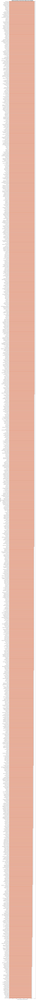

In [23]:
import matplotlib.pyplot as plt

# 1. Sort the data so the graph is organized (longest bars at the top)
# We sort ascending=True for horizontal bar charts so the biggest is at the top
sorted_bacteria = bacteria_gt_60_zeros.sort_values(ascending=True)

# 2. Set up the figure size (making it tall enough to fit all the names)
plt.figure(figsize=(12, max(8, len(sorted_bacteria) * 0.3))) 

# 3. Create the horizontal bar chart
sorted_bacteria.plot(kind='barh', color='coral', edgecolor='black')

# 4. Add labels and a title
plt.title('Bacteria with More Than 60 Zero Values Across Samples', fontsize=16, fontweight='bold')
plt.xlabel('Number of Samples with 0% Abundance', fontsize=12)
plt.ylabel('Bacteria (Taxa)', fontsize=12)

# 5. Add the exact number next to each bar for easy reading
for index, value in enumerate(sorted_bacteria):
    plt.text(value + 0.5, index, str(value), va='center', fontsize=10)

# 6. Adjust layout so the long bacteria names don't get cut off
plt.tight_layout()

# 7. Show the plot!
plt.show()

# Optional: If you want to save it as an image file automatically, uncomment the line below:
# plt.savefig("bacteria_high_zeros_plot.png", dpi=300)

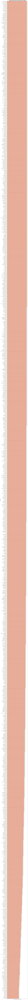

In [24]:
import matplotlib.pyplot as plt

# 1. Sort the data so the graph is organized (longest bars at the top)
# We sort ascending=True for horizontal bar charts so the biggest is at the top
sorted_bacteria = bacteria_gt_40_zeros.sort_values(ascending=True)

# 2. Set up the figure size (making it tall enough to fit all the names)
plt.figure(figsize=(12, max(8, len(sorted_bacteria) * 0.3))) 

# 3. Create the horizontal bar chart
sorted_bacteria.plot(kind='barh', color='coral', edgecolor='black')

# 4. Add labels and a title
plt.title('Bacteria with More Than 40 Zero Values Across Samples', fontsize=16, fontweight='bold')
plt.xlabel('Number of Samples with 0% Abundance', fontsize=12)
plt.ylabel('Bacteria (Taxa)', fontsize=12)

# 5. Add the exact number next to each bar for easy reading
for index, value in enumerate(sorted_bacteria):
    plt.text(value + 0.5, index, str(value), va='center', fontsize=10)

# 6. Adjust layout so the long bacteria names don't get cut off
plt.tight_layout()

# 7. Show the plot!
plt.show()

In [25]:
# Check how many values are equal to 0 for EACH fungi (column)
fun_equal_to_0_counts = (fun_cleaned_df == 0).sum()

# Print the results
print("Count of values = 0 for each fungi column:")
print(fun_equal_to_0_counts)

Count of values = 0 for each fungi column:
taxa [%]
Leptodiscella africana               68
Leptodiscella sp.                    69
Aplosporella hesperidica             69
Aplosporella prunicola               69
Lasiodiplodia gonubiensis            69
Lasiodiplodia pseudotheobromae       64
Lasiodiplodia sp.                    67
Lasiodiplodia theobromae             46
Macrophomina phaseolina              33
Macrophomina pseudophaseolina        68
Microdiplodia miyakei                51
Microdiplodia sp.                    67
Sphaeropsis eucalypticola            68
Antennariella placitae               61
Capnodium coffeae                    68
Capnodium sp.                        61
Leptoxyphium madagascariense         59
Leptoxyphium sp.                     69
Cladosporium alternicoloratum        69
Cladosporium flabelliforme           60
Cladosporium herbarum                 3
Cladosporium ramotenellum            69
Cladosporium sp.                     53
Cladosporium sphaerospermum 

In [26]:
# 1. Filter to keep only the fungi where the zero count is strictly greater than 60
fungi_gt_60_zeros = fun_equal_to_0_counts[fun_equal_to_0_counts > 60]

# 2. Find out exactly HOW MANY fungi meet this condition
num_fungi_gt_60 = len(fungi_gt_60_zeros)

# 3. Print the final results
print(f"Total number of fungi with MORE THAN 60 zero values: {num_fungi_gt_60}")

print("\nHere are the specific fungi and their counts:")
print(fungi_gt_60_zeros)

# Optional: If you want to save this specific filtered list to a CSV file to view it all:
# fungi_gt_60_zeros.to_csv("fungi_gt_60_zeros.csv", header=["Count_of_Zeros"])

Total number of fungi with MORE THAN 60 zero values: 858

Here are the specific fungi and their counts:
taxa [%]
Leptodiscella africana               68
Leptodiscella sp.                    69
Aplosporella hesperidica             69
Aplosporella prunicola               69
Lasiodiplodia gonubiensis            69
Lasiodiplodia pseudotheobromae       64
Lasiodiplodia sp.                    67
Macrophomina pseudophaseolina        68
Microdiplodia sp.                    67
Sphaeropsis eucalypticola            68
Antennariella placitae               61
Capnodium coffeae                    68
Capnodium sp.                        61
Leptoxyphium sp.                     69
Cladosporium alternicoloratum        69
Cladosporium ramotenellum            69
Cladosporium sphaerospermum          66
Dissoconium proteae                  67
Ramichloridium apiculatum            65
Ramichloridium luteum                68
Ramichloridium sp.                   69
Pseudoramichloridium brasilianum     68
Acrodon

In [27]:
# --- 1. Filter Bacteria Data ---
# Keep only columns (taxa) where the count of zeros is less than or equal to 60
bac_cleaned_1 = bac_cleaned_df.loc[:, (bac_cleaned_df == 0).sum() <= 60]

# --- 2. Filter Fungi Data ---
# Keep only columns (taxa) where the count of zeros is less than or equal to 60
fun_cleaned_1 = fun_cleaned_df.loc[:, (fun_cleaned_df == 0).sum() <= 60]


# --- Let's check how many taxa were removed! ---
print("--- BACTERIA ---")
print(f"Original shape: {bac_cleaned_df.shape}")
print(f"New shape:      {bac_cleaned_1.shape}")
print(f"Taxa removed:   {bac_cleaned_df.shape[1] - bac_cleaned_1.shape[1]}")

print("\n--- FUNGI ---")
print(f"Original shape: {fun_cleaned_df.shape}")
print(f"New shape:      {fun_cleaned_1.shape}")
print(f"Taxa removed:   {fun_cleaned_df.shape[1] - fun_cleaned_1.shape[1]}")

--- BACTERIA ---
Original shape: (70, 1789)
New shape:      (70, 709)
Taxa removed:   1080

--- FUNGI ---
Original shape: (70, 1155)
New shape:      (70, 297)
Taxa removed:   858


In [29]:
bac_cleaned_1

taxa [%],Nitrososphaera viennensis,Nitrosocosmicus oleophilus,Nitrosocosmicus sp.,Nitrososphaera sp.,Methanobacterium oryzae,Methanobacterium sp.,Methanocella sp.,Methanosarcina mazei,Methanosarcina sp.,Methanomassiliicoccus sp.,Abditibacterium sp.,Koribacter sp.,Koribacter versatilis,Bryobacter sp.,Paludibaculum sp.,Solibacter sp.,Aridibacter sp.,Blastocatella sp.,Stenotrophobacter sp.,Stenotrophobacter terrae,Tellurimicrobium multivorans,Arenimicrobium luteum,Brevitalea aridisoli,Brevitalea deliciosa,Luteitalea pratensis,Luteitalea sp.,Vicinamibacter silvestris,Vicinamibacter sp.,Iamia sp.,Ilumatobacter sp.,Mycobacterium brisbanense,Mycobacterium elephantis,Mycobacterium sp.,Mycobacterium tusciae,Nocardia paucivorans,Nocardia rhamnosiphila,Nocardia sp.,Rhodococcus sp.,Acidothermus sp.,Cryptosporangium sp.,Frankia sp.,Jatrophihabitans sp.,Blastococcus aggregatus,Blastococcus sp.,Geodermatophilus arenarius,Geodermatophilus daqingensis,Geodermatophilus ruber,Geodermatophilus sabuli,Geodermatophilus sp.,Geodermatophilus tzadiensis,Nakamurella silvestris,Nakamurella sp.,Glycomyces algeriensis,Glycomyces sp.,Angustibacter sp.,Kineococcus sp.,Kineosporia sp.,Quadrisphaera sp.,Beutenbergia cavernae,Cellulomonas cellasea,Cellulomonas hominis,Cellulomonas sp.,Intrasporangium flavum,Intrasporangium sp.,Janibacter melonis,Knoellia flava,Lapillicoccus sp.,Oryzihumus sp.,Pedococcus cremeus,Pedococcus dokdonensis,Terrabacter sp.,Phycicoccus elongatus,Agromyces flavus,Agromyces sp.,Agromyces ulmi,Lysinimonas sp.,Microbacterium koreense,Microbacterium paraoxydans,Microbacterium thalassium,Arthrobacter crystallopoietes,Arthrobacter ramosus,Kocuria rosea,Paenarthrobacter sp.,Pseudarthrobacter oxydans,Pseudarthrobacter sp.,Sinomonas sp.,Cellulosimicrobium cellulans,Isoptericola halotolerans,Promicromonospora sp.,Promicromonospora sukumoe,Actinocatenispora rupis,Actinoplanes deccanensis,Actinoplanes derwentensis,Actinoplanes philippinensis,Actinoplanes sp.,Actinoplanes subtropicus,Actinoplanes toevensis,Asanoa sp.,Catellatospora bangladeshensis,Catellatospora sp.,Catellatospora tagetis,Catelliglobosispora koreensis,Dactylosporangium sp.,Hamadaea sp.,Longispora sp.,Luedemannella flava,Luedemannella helvata,Luedemannella sp.,Micromonospora chalcea,Micromonospora echinaurantiaca,Micromonospora echinospora,Micromonospora narathiwatensis,Micromonospora sp.,Phytohabitans sp.,Planosporangium flavigriseum,Planosporangium sp.,Plantactinospora mayteni,Plantactinospora siamensis,Plantactinospora sp.,Polymorphospora rubra,Rhizocola sp.,Rugosimonospora sp.,Salinispora pacifica,Salinispora sp.,Spirilliplanes yamanashiensis,Virgisporangium ochraceum,Virgisporangium sp.,Micromonospora phaseoli,Actinopolymorpha singaporensis,Aeromicrobium marinum,Aeromicrobium ponti,Aeromicrobium sp.,Kribbella endophytica,Kribbella sancticallisti,Kribbella sandramycini,Kribbella sp.,Marmoricola bigeumensis,Marmoricola sp.,Marmoricola terrae,Nocardioides aestuarii,Nocardioides albus,Nocardioides dilutus,Nocardioides exalbidus,Nocardioides hankookensis,Nocardioides iriomotensis,Nocardioides islandensis,Nocardioides kandeliae,Nocardioides koreensis,Nocardioides sp.,Nocardioides taihuensis,Haloactinopolyspora sp.,Jiangella alkaliphila,Microlunatus ginsengisoli,Microlunatus panaciterrae,Microlunatus sp.,Actinomycetospora sp.,Actinophytocola sp.,Actinophytocola xanthii,Allokutzneria albata,Amycolatopsis albispora,Amycolatopsis mediterranei,Amycolatopsis rhabdoformis,Amycolatopsis sp.,Amycolatopsis taiwanensis,Crossiella sp.,Kibdelosporangium sp.,Lechevalieria sp.,Lentzea aerocolonigenes,Lentzea albidocapillata,Pseudonocardia endophytica,Pseudonocardia halophobica,Pseudonocardia hispaniensis,Pseudonocardia sp.,Pseudonocardia zijingensis,Saccharopolyspora shandongensis,Saccharopolyspora sp.,Saccharopolyspora spinosa,Saccharothrix sp.,Saccharothrix xinjiangensis,Allostreptomyces sp.,Kitasatospora cheerisanensis,Streptomyces aculeolatus,Streptomyces albidoflavus,Streptomyces avermitilis,S

In [32]:
bac_cleaned_1.to_csv("bacteria_V1.csv", index=True)
fun_cleaned_1.to_csv("fungi_V1.csv", index=True)

In [28]:
import seaborn as sns
import matplotlib.pyplot as plt

# ==========================================
# 1. FULL FILTERED BACTERIA HEATMAP
# ==========================================

# Make a very large figure to accommodate all columns
plt.figure(figsize=(24, 14))

# Create the heatmap
sns.heatmap(bac_cleaned_1, cmap="YlOrRd", robust=True, 
            cbar_kws={'label': 'Relative Abundance (%)'})

plt.title("Complete Heatmap of Filtered Bacteria", fontsize=18, fontweight='bold')
plt.xlabel("Bacteria Taxa", fontsize=14)
plt.ylabel("Sample Codes", fontsize=14)

# Rotate x-axis labels by 90 degrees and make font smaller to fit them all
plt.xticks(rotation=90, ha='center', fontsize=8)
plt.yticks(fontsize=10)
plt.tight_layout()

# Save the plot as a high-resolution image file
plt.savefig("Full_Filtered_Bacteria_Heatmap.png", dpi=300)
plt.close() # Close the figure to free up memory

print("✅ Saved Bacteria heatmap as 'Full_Filtered_Bacteria_Heatmap.png'")


# ==========================================
# 2. FULL FILTERED FUNGI HEATMAP
# ==========================================

# Make a very large figure to accommodate all columns
plt.figure(figsize=(24, 14))

# Create the heatmap
sns.heatmap(fun_cleaned_1, cmap="YlGnBu", robust=True, 
            cbar_kws={'label': 'Relative Abundance (%)'})

plt.title("Complete Heatmap of Filtered Fungi", fontsize=18, fontweight='bold')
plt.xlabel("Fungi Taxa", fontsize=14)
plt.ylabel("Sample Codes", fontsize=14)

# Rotate x-axis labels by 90 degrees and make font smaller to fit them all
plt.xticks(rotation=90, ha='center', fontsize=8)
plt.yticks(fontsize=10)
plt.tight_layout()

# Save the plot as a high-resolution image file
plt.savefig("Full_Filtered_Fungi_Heatmap.png", dpi=300)
plt.close()

print("✅ Saved Fungi heatmap as 'Full_Filtered_Fungi_Heatmap.png'")

✅ Saved Bacteria heatmap as 'Full_Filtered_Bacteria_Heatmap.png'
✅ Saved Fungi heatmap as 'Full_Filtered_Fungi_Heatmap.png'


In [30]:
df_check = pd.read_csv("taxa_data_v1/bacteria_V1.csv")

In [31]:
df_check

,Nitrososphaera viennensis,Nitrosocosmicus oleophilus,Nitrosocosmicus sp.,Nitrososphaera sp.,Methanobacterium oryzae,Methanobacterium sp.,Methanocella sp.,Methanosarcina mazei,Methanosarcina sp.,Methanomassiliicoccus sp.,Abditibacterium sp.,Koribacter sp.,Koribacter versatilis,Bryobacter sp.,Paludibaculum sp.,Solibacter sp.,Aridibacter sp.,Blastocatella sp.,Stenotrophobacter sp.,Stenotrophobacter terrae,Tellurimicrobium multivorans,Arenimicrobium luteum,Brevitalea aridisoli,Brevitalea deliciosa,Luteitalea pratensis,Luteitalea sp.,Vicinamibacter silvestris,Vicinamibacter sp.,Iamia sp.,Ilumatobacter sp.,Mycobacterium brisbanense,Mycobacterium elephantis,Mycobacterium sp.,Mycobacterium tusciae,Nocardia paucivorans,Nocardia rhamnosiphila,Nocardia sp.,Rhodococcus sp.,Acidothermus sp.,Cryptosporangium sp.,Frankia sp.,Jatrophihabitans sp.,Blastococcus aggregatus,Blastococcus sp.,Geodermatophilus arenarius,Geodermatophilus daqingensis,Geodermatophilus ruber,Geodermatophilus sabuli,Geodermatophilus sp.,Geodermatophilus tzadiensis,Nakamurella silvestris,Nakamurella sp.,Glycomyces algeriensis,Glycomyces sp.,Angustibacter sp.,Kineococcus sp.,Kineosporia sp.,Quadrisphaera sp.,Beutenbergia cavernae,Cellulomonas cellasea,Cellulomonas hominis,Cellulomonas sp.,Intrasporangium flavum,Intrasporangium sp.,Janibacter melonis,Knoellia flava,Lapillicoccus sp.,Oryzihumus sp.,Pedococcus cremeus,Pedococcus dokdonensis,Terrabacter sp.,Phycicoccus elongatus,Agromyces flavus,Agromyces sp.,Agromyces ulmi,Lysinimonas sp.,Microbacterium koreense,Microbacterium paraoxydans,Microbacterium thalassium,Arthrobacter crystallopoietes,Arthrobacter ramosus,Kocuria rosea,Paenarthrobacter sp.,Pseudarthrobacter oxydans,Pseudarthrobacter sp.,Sinomonas sp.,Cellulosimicrobium cellulans,Isoptericola halotolerans,Promicromonospora sp.,Promicromonospora sukumoe,Actinocatenispora rupis,Actinoplanes deccanensis,Actinoplanes derwentensis,Actinoplanes philippinensis,Actinoplanes sp.,Actinoplanes subtropicus,Actinoplanes toevensis,Asanoa sp.,Catellatospora bangladeshensis,Catellatospora sp.,Catellatospora tagetis,Catelliglobosispora koreensis,Dactylosporangium sp.,Hamadaea sp.,Longispora sp.,Luedemannella flava,Luedemannella helvata,Luedemannella sp.,Micromonospora chalcea,Micromonospora echinaurantiaca,Micromonospora echinospora,Micromonospora narathiwatensis,Micromonospora sp.,Phytohabitans sp.,Planosporangium flavigriseum,Planosporangium sp.,Plantactinospora mayteni,Plantactinospora siamensis,Plantactinospora sp.,Polymorphospora rubra,Rhizocola sp.,Rugosimonospora sp.,Salinispora pacifica,Salinispora sp.,Spirilliplanes yamanashiensis,Virgisporangium ochraceum,Virgisporangium sp.,Micromonospora phaseoli,Actinopolymorpha singaporensis,Aeromicrobium marinum,Aeromicrobium ponti,Aeromicrobium sp.,Kribbella endophytica,Kribbella sancticallisti,Kribbella sandramycini,Kribbella sp.,Marmoricola bigeumensis,Marmoricola sp.,Marmoricola terrae,Nocardioides aestuarii,Nocardioides albus,Nocardioides dilutus,Nocardioides exalbidus,Nocardioides hankookensis,Nocardioides iriomotensis,Nocardioides islandensis,Nocardioides kandeliae,Nocardioides koreensis,Nocardioides sp.,Nocardioides taihuensis,Haloactinopolyspora sp.,Jiangella alkaliphila,Microlunatus ginsengisoli,Microlunatus panaciterrae,Microlunatus sp.,Actinomycetospora sp.,Actinophytocola sp.,Actinophytocola xanthii,Allokutzneria albata,Amycolatopsis albispora,Amycolatopsis mediterranei,Amycolatopsis rhabdoformis,Amycolatopsis sp.,Amycolatopsis taiwanensis,Crossiella sp.,Kibdelosporangium sp.,Lechevalieria sp.,Lentzea aerocolonigenes,Lentzea albidocapillata,Pseudonocardia endophytica,Pseudonocardia halophobica,Pseudonocardia hispaniensis,Pseudonocardia sp.,Pseudonocardia zijingensis,Saccharopolyspora shandongensis,Saccharopolyspora sp.,Saccharopolyspora spinosa,Saccharothrix sp.,Saccharothrix xinjiangensis,Allostreptomyces sp.,Kitasatospora cheerisanensis,Streptomyces aculeolatus,Streptomyces albidoflavus,Streptomyces avermitilis,Streptomy

In [29]:
metadata_df

,Código,Nombre de muestra,Fecha de \nrecolección,Nombre de parcela,Cultivo,Ciudad,País,Grados Minutos Segundos (DMS) \no Grados Decimales (DD),Variedad,Densidad\n(plantas/hectarea),Densidad\n(plantas/acre),Density DB (plants/hectare),Año\nplantación,Cultivo del\naño previo,Uso de\nirrigación,Tipo de\nirrigación,Tipo de suelo,Prácticas\norgánicas,Métodos\nbiodinámicos,Tipo,Nombre,Fecha de\naplicación,Dosis,Tipo.1,Nombre.1,Fecha de\naplicación.1,Dosis.1,Tipo.2,Nombre.2,Fecha de\naplicación.2,Dosis.2,Comentarios
0,AZM03Y,H3-N 2 Rice,2024-01-30,H3-N,NaN,Palmira,Colombia,"3.4972838565934, -76.3605656321979",NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN
1,AZM03Z,E1 2 Beans,2024-01-30,E1,Frijol,Palmira,Colombia,"3.50039137138112, -76.3716758212893",Mas de 100,190000.0,NaN,190000,2023.0,Frijol,Regular,Superficie,Arcilloso,Si,No,Fertilizante sintético,"Kelatex Boro, Mg, Zintrac, Cabtrac, 18-45-0",2023-02-15,"200cc, 400gr, 140cc, 200cc, 300gr",Fertilizante sintético,"Kelatex Boro, Mg, Zintrac, Cabtrac, 0-32-43",2023-02-22,"200cc, 400gr, 140cc, 200cc, 400gr",Fertilizante sintético,"Kelatex Boro, Mg, Zintrac, Cabtrac, 0-32-43",2023-03-03,"200cc, 400gr, 140cc, 200cc, 400gr",NaN
2,AZM040,P3 5 Forrajes,2024-01-29,P3,Forrajes,Palmira,Colombia,"3.50112, -76.34468833",Brachiaria brizantha CIAT 26110 + Leucaena diversifolia,2000.0,NaN,2000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN
3,AZM041,L1-N 1 Beans,2024-01-29,L1-N,Frijol,Palmira,Colombia,"3.50504586625444, -76.3561248808907",Mas de 100,190000.0,NaN,190000,1024.0,Frijol,Regular,Superficie,Arcilloso,No,No,Fertilizante sintético,"Boro, Kelatex Mg y Zinc, Cabtrac, 18-45-0",2024-02-01,"200gr, 400gr, 400gr, 200cc, 200gr",Fertilizante sintético,"Boro, Kelatex Mg y Zinc, Cabtrac, 0-32-43",2024-02-06,"200gr, 400gr, 400gr, 200cc, 400gr",Fertilizante sintético,"Boro, Kelatex Mg y Zinc, Fulviplex, 0-32-43",2024-02-14,"200gr, 400gr, 400gr, 800gr, 400gr",NaN
4,AZM042,I1-S 3 Rice,2024-01-30,I1-S,NaN,Palmira,Colombia,"3.50207088147809, -76.3607243952992",NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN
5,AZM043,P3 2 Forrajes,2024-01-29,P3,Forrajes,Palmira,Colombia,"3.501091667, -76.346795",Brachiaria brizantha CIAT 26110 + Leucaena diversifolia,2000.0,NaN,2000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN
6,AZM044,N1-N 1 Cassava,2024-01-29,N1-N,"Yuca, Mandioca, Tapioca",Palmira,Colombia,"3.50609175111657, -76.3539137431592",Multiples variedades,10000.0,NaN,10000,2022.0,Descanso,Semi-regular,Superficie,Arcilloso,No,No,Fertilizante sintético,"10-30-10, Sulfato de Hierro, Sulfato de Manganeso, Sulfato Zinc",2022-12-04,"200,10,10,13",NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN
7,AZM045,N3 F 1 Forrajes,2024-01-29,N3 Forrajes,Forrajes,Palmira,Colombia,"3.500611667, -76.35005333",Urochloa humidicola cv. Tully (CIAT 679),NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN
8,AZM046,M3-N 2 Rice,2024-01-29,M3-N,NaN,Palmira,Colombia,"3.50068209654776, -76.3535613128735",NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN
9,AZM047,O1-N 1 Beans,2024-01-29,O1-N,Crotalaria,Palmira,Colombia,"3.5075848163281, -76.3501491292411",9336,160000.0,NaN,160000,1024.0,Frijol,Regular,Superficie,Arcilloso,Si,No,NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN


In [30]:
bac_cleaned_1.index

Index(['AZM03Y', 'AZM03Z', 'AZM040', 'AZM041', 'AZM042', 'AZM043', 'AZM044',
       'AZM045', 'AZM046', 'AZM047', 'AZM048', 'AZM049', 'AZM04A', 'AZM04B',
       'AZM04C', 'AZM04D', 'AZM04E', 'AZM04F', 'AZM04G', 'AZM04H', 'AZM04I',
       'AZM04J', 'AZM04K', 'AZM04L', 'AZM04M', 'AZM04N', 'AZM04O', 'AZM04P',
       'AZM04Q', 'AZM04R', 'AZM04S', 'AZM04T', 'AZM04U', 'AZM04V', 'AZM04W',
       'AZM04X', 'AZM04Y', 'AZM04Z', 'AZM051', 'AZM052', 'AZM053', 'AZM054',
       'AZM055', 'AZM056', 'AZM057', 'AZM058', 'AZM059', 'AZM05A', 'AZM05B',
       'AZM05C', 'AZM05E', 'AZM05F', 'AZM05G', 'AZM05H', 'AZM05I', 'AZM05J',
       'AZM05K', 'AZM05L', 'AZM05M', 'AZM05N', 'AZM05O', 'AZM05P', 'AZM05Q',
       'AZM05R', 'AZM05S', 'AZM05T', 'AZM05U', 'AZM05V', 'AZM05W', 'AZM05X'],
      dtype='object', name='Sample_Code')

In [31]:
metadata_df['Código']

0     AZM03Y
1     AZM03Z
2     AZM040
3     AZM041
4     AZM042
5     AZM043
6     AZM044
7     AZM045
8     AZM046
9     AZM047
10    AZM048
11    AZM049
12    AZM04A
13    AZM04B
14    AZM04C
15    AZM04D
16    AZM04E
17    AZM04F
18    AZM04G
19    AZM04H
20    AZM04I
21    AZM04J
22    AZM04K
23    AZM04L
24    AZM04M
25    AZM04N
26    AZM04O
27    AZM04P
28    AZM04Q
29    AZM04R
30    AZM04S
31    AZM04T
32    AZM04U
33    AZM04V
34    AZM04W
35    AZM04X
36    AZM04Y
37    AZM04Z
38    AZM050
39    AZM051
40    AZM052
41    AZM053
42    AZM054
43    AZM055
44    AZM056
45    AZM057
46    AZM058
47    AZM059
48    AZM05A
49    AZM05B
50    AZM05C
51    AZM05D
52    AZM05E
53    AZM05F
54    AZM05G
55    AZM05H
56    AZM05I
57    AZM05J
58    AZM05K
59    AZM05L
60    AZM05M
61    AZM05N
62    AZM05O
63    AZM05P
64    AZM05Q
65    AZM05R
66    AZM05S
67    AZM05T
68    AZM05U
69    AZM05V
70    AZM05W
71    AZM05X
Name: Código, dtype: object

In [32]:
metadata_df.columns

Index(['Código', 'Nombre de muestra', 'Fecha de \nrecolección',
       'Nombre de parcela', 'Cultivo', 'Ciudad', 'País',
       'Grados Minutos Segundos (DMS) \no Grados Decimales (DD)', 'Variedad',
       'Densidad\n(plantas/hectarea)', 'Densidad\n(plantas/acre)',
       'Density DB (plants/hectare)', 'Año\nplantación',
       'Cultivo del\naño previo', 'Uso de\nirrigación', 'Tipo de\nirrigación',
       'Tipo de suelo', 'Prácticas\norgánicas', 'Métodos\nbiodinámicos',
       'Tipo', 'Nombre', 'Fecha de\naplicación', 'Dosis', 'Tipo.1', 'Nombre.1',
       'Fecha de\naplicación.1', 'Dosis.1', 'Tipo.2', 'Nombre.2',
       'Fecha de\naplicación.2', 'Dosis.2', 'Comentarios'],
      dtype='object')

In [33]:
# Diccionario de mapeo para cambiar los nombres de las columnas a inglés
column_mapping = {
    'Código': 'Code',
    'Nombre de muestra': 'Sample_Name',
    'Fecha de \nrecolección': 'Collection_Date',
    'Nombre de parcela': 'Plot_Name',
    'Cultivo': 'Crop',
    'Ciudad': 'City',
    'País': 'Country',
    'Grados Minutos Segundos (DMS) \no Grados Decimales (DD)': 'Coordinates_DMS_DD',
    'Variedad': 'Variety',
    'Densidad\n(plantas/hectarea)': 'Density_Plants_Hectare',
    'Densidad\n(plantas/acre)': 'Density_Plants_Acre',
    'Density DB (plants/hectare)': 'Density_DB_Plants_Hectare',
    'Año\nplantación': 'Planting_Year',
    'Cultivo del\naño previo': 'Previous_Year_Crop',
    'Uso de\nirrigación': 'Irrigation_Usage',
    'Tipo de\nirrigación': 'Irrigation_Type',
    'Tipo de suelo': 'Soil_Type',
    'Prácticas\norgánicas': 'Organic_Practices',
    'Métodos\nbiodinámicos': 'Biodynamic_Methods',
    'Tipo': 'Product_1_Type',
    'Nombre': 'Product_1_Name',
    'Fecha de\naplicación': 'Product_1_Application_Date',
    'Dosis': 'Product_1_Dosage',
    'Tipo.1': 'Product_2_Type',
    'Nombre.1': 'Product_2_Name',
    'Fecha de\naplicación.1': 'Product_2_Application_Date',
    'Dosis.1': 'Product_2_Dosage',
    'Tipo.2': 'Product_3_Type',
    'Nombre.2': 'Product_3_Name',
    'Fecha de\naplicación.2': 'Product_3_Application_Date',
    'Dosis.2': 'Product_3_Dosage',
    'Comentarios': 'Comments'
}

# Renombrar las columnas en el DataFrame de metadatos
metadata_df.rename(columns=column_mapping, inplace=True)

# Comprobar que los nombres cambiaron correctamente
print("Nuevas columnas de Metadata:")
print(metadata_df.columns[:10].tolist())

Nuevas columnas de Metadata:
['Code', 'Sample_Name', 'Collection_Date', 'Plot_Name', 'Crop', 'City', 'Country', 'Coordinates_DMS_DD', 'Variety', 'Density_Plants_Hectare']


In [34]:
metadata_df

,Code,Sample_Name,Collection_Date,Plot_Name,Crop,City,Country,Coordinates_DMS_DD,Variety,Density_Plants_Hectare,Density_Plants_Acre,Density_DB_Plants_Hectare,Planting_Year,Previous_Year_Crop,Irrigation_Usage,Irrigation_Type,Soil_Type,Organic_Practices,Biodynamic_Methods,Product_1_Type,Product_1_Name,Product_1_Application_Date,Product_1_Dosage,Product_2_Type,Product_2_Name,Product_2_Application_Date,Product_2_Dosage,Product_3_Type,Product_3_Name,Product_3_Application_Date,Product_3_Dosage,Comments
0,AZM03Y,H3-N 2 Rice,2024-01-30,H3-N,NaN,Palmira,Colombia,"3.4972838565934, -76.3605656321979",NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN
1,AZM03Z,E1 2 Beans,2024-01-30,E1,Frijol,Palmira,Colombia,"3.50039137138112, -76.3716758212893",Mas de 100,190000.0,NaN,190000,2023.0,Frijol,Regular,Superficie,Arcilloso,Si,No,Fertilizante sintético,"Kelatex Boro, Mg, Zintrac, Cabtrac, 18-45-0",2023-02-15,"200cc, 400gr, 140cc, 200cc, 300gr",Fertilizante sintético,"Kelatex Boro, Mg, Zintrac, Cabtrac, 0-32-43",2023-02-22,"200cc, 400gr, 140cc, 200cc, 400gr",Fertilizante sintético,"Kelatex Boro, Mg, Zintrac, Cabtrac, 0-32-43",2023-03-03,"200cc, 400gr, 140cc, 200cc, 400gr",NaN
2,AZM040,P3 5 Forrajes,2024-01-29,P3,Forrajes,Palmira,Colombia,"3.50112, -76.34468833",Brachiaria brizantha CIAT 26110 + Leucaena diversifolia,2000.0,NaN,2000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN
3,AZM041,L1-N 1 Beans,2024-01-29,L1-N,Frijol,Palmira,Colombia,"3.50504586625444, -76.3561248808907",Mas de 100,190000.0,NaN,190000,1024.0,Frijol,Regular,Superficie,Arcilloso,No,No,Fertilizante sintético,"Boro, Kelatex Mg y Zinc, Cabtrac, 18-45-0",2024-02-01,"200gr, 400gr, 400gr, 200cc, 200gr",Fertilizante sintético,"Boro, Kelatex Mg y Zinc, Cabtrac, 0-32-43",2024-02-06,"200gr, 400gr, 400gr, 200cc, 400gr",Fertilizante sintético,"Boro, Kelatex Mg y Zinc, Fulviplex, 0-32-43",2024-02-14,"200gr, 400gr, 400gr, 800gr, 400gr",NaN
4,AZM042,I1-S 3 Rice,2024-01-30,I1-S,NaN,Palmira,Colombia,"3.50207088147809, -76.3607243952992",NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN
5,AZM043,P3 2 Forrajes,2024-01-29,P3,Forrajes,Palmira,Colombia,"3.501091667, -76.346795",Brachiaria brizantha CIAT 26110 + Leucaena diversifolia,2000.0,NaN,2000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN
6,AZM044,N1-N 1 Cassava,2024-01-29,N1-N,"Yuca, Mandioca, Tapioca",Palmira,Colombia,"3.50609175111657, -76.3539137431592",Multiples variedades,10000.0,NaN,10000,2022.0,Descanso,Semi-regular,Superficie,Arcilloso,No,No,Fertilizante sintético,"10-30-10, Sulfato de Hierro, Sulfato de Manganeso, Sulfato Zinc",2022-12-04,"200,10,10,13",NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN
7,AZM045,N3 F 1 Forrajes,2024-01-29,N3 Forrajes,Forrajes,Palmira,Colombia,"3.500611667, -76.35005333",Urochloa humidicola cv. Tully (CIAT 679),NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN
8,AZM046,M3-N 2 Rice,2024-01-29,M3-N,NaN,Palmira,Colombia,"3.50068209654776, -76.3535613128735",NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN
9,AZM047,O1-N 1 Beans,2024-01-29,O1-N,Crotalaria,Palmira,Colombia,"3.5075848163281, -76.3501491292411",9336,160000.0,NaN,160000,1024.0,Frijol,Regular,Superficie,Arcilloso,Si,No,NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN


In [35]:
# 1. Calculate the percentage of NaN values in each column
nan_percentages = (metadata_df.isna().sum() / len(metadata_df)) * 100

# 2. Round to 2 decimal places and sort from highest percentage to lowest
nan_percentages = nan_percentages.round(2).sort_values(ascending=False)

# 3. Print the results clearly
print("--- Percentage of NaN values in each column (%) ---")
print(nan_percentages)

# Optional: If you want to see ONLY the columns that actually have missing data (greater than 0%)
# cols_with_nans = nan_percentages[nan_percentages > 0]
# print("\n--- Columns with actual missing data ---")
# print(cols_with_nans)

--- Percentage of NaN values in each column (%) ---
Density_Plants_Acre           100.00
Comments                       97.22
Product_3_Dosage               83.33
Product_3_Application_Date     83.33
Product_3_Name                 83.33
Product_3_Type                 83.33
Product_2_Dosage               68.06
Product_2_Application_Date     68.06
Product_2_Name                 68.06
Product_2_Type                 68.06
Product_1_Dosage               59.72
Product_1_Application_Date     56.94
Product_1_Name                 56.94
Biodynamic_Methods             55.56
Product_1_Type                 55.56
Soil_Type                      48.61
Organic_Practices              45.83
Irrigation_Type                45.83
Irrigation_Usage               45.83
Previous_Year_Crop             45.83
Planting_Year                  45.83
Density_Plants_Hectare         40.28
Variety                        18.06
Crop                           18.06
Sample_Name                     0.00
Density_DB_Plants_Hecta

In [36]:
# 1. Extract the unique sample codes into Sets
metadata_codes = set(metadata_df['Code'].dropna())

# 2. Extract the codes from your cleaned abundance data (which are currently the Index)
# You can use bac_cleaned_df or bac_cleaned_1, they have the same rows
bac_codes = set(bac_cleaned_1.index)
fun_codes = set(fun_cleaned_1.index)

# 3. Find the exact codes that are in Metadata but NOT in the abundance data
missing_in_bac = metadata_codes - bac_codes
missing_in_fun = metadata_codes - fun_codes

# 4. Print the counts
print(f"Total codes in Metadata: {len(metadata_codes)}")
print(f"Total codes in Bacteria Data: {len(bac_codes)}")
print(f"Total codes in Fungi Data: {len(fun_codes)}")

# 5. Print the exact missing codes!
print("\n🔍 Codes in Metadata but MISSING in Bacteria data:")
if not missing_in_bac:
    print("None! All metadata codes are present.")
else:
    print(missing_in_bac)

print("\n🔍 Codes in Metadata but MISSING in Fungi data:")
if not missing_in_fun:
    print("None! All metadata codes are present.")
else:
    print(missing_in_fun)
    
# Optional: To check the reverse (Codes in Abundance but missing in Metadata)
# print("\nCodes in Bacteria but MISSING in Metadata:", bac_codes - metadata_codes)

Total codes in Metadata: 72
Total codes in Bacteria Data: 70
Total codes in Fungi Data: 70

🔍 Codes in Metadata but MISSING in Bacteria data:
{'AZM050', 'AZM05D'}

🔍 Codes in Metadata but MISSING in Fungi data:
{'AZM050', 'AZM05D'}


In [37]:
# 1. Remove the two specific sample codes ('AZM05D' and 'AZM050')
# ~ means "NOT", so we keep rows that are NOT in this list
samples_to_remove = ['AZM05D', 'AZM050']
metadata_df_cleaned = metadata_df[~metadata_df['Code'].isin(samples_to_remove)].copy()

# 2. Fix the 'Crop' column (Crotalaria spacing issue)
# .str.strip() removes any invisible spaces at the beginning or end of the words
metadata_df_cleaned['Crop'] = metadata_df_cleaned['Crop'].str.strip()

# 3. Fix the 'Planting_Year' typo (1024 -> 2024)
# We provide both the number and the string format just in case pandas loaded it as text
metadata_df_cleaned['Planting_Year'] = metadata_df_cleaned['Planting_Year'].replace({1024: 2024, '1024': '2024'})

# 4. Fix 'Previous_Year_Crop' ('frijol' vs 'Frijol' and spacing)
# We strip extra spaces and use .str.title() which automatically capitalizes the first letter of each word
metadata_df_cleaned['Previous_Year_Crop'] = metadata_df_cleaned['Previous_Year_Crop'].str.strip().str.title()

# --- Optional: Let's verify the fixes! ---
print(f"Original rows: {len(metadata_df)}")
print(f"Cleaned rows: {len(metadata_df_cleaned)} (2 removed!)")

print("\nVerify Planting Year (should not contain 1024):")
print(metadata_df_cleaned['Planting_Year'].value_counts())

print("\nVerify Previous Year Crop (should only say 'Frijol', not 'frijol'):")
print(metadata_df_cleaned['Previous_Year_Crop'].value_counts())

metadata_df = metadata_df_cleaned

Original rows: 72
Cleaned rows: 70 (2 removed!)

Verify Planting Year (should not contain 1024):
Planting_Year
2023.0    20
2022.0    10
2024.0     7
2021.0     1
2019.0     1
Name: count, dtype: int64

Verify Previous Year Crop (should only say 'Frijol', not 'frijol'):
Previous_Year_Crop
Frijol                     15
Descanso                   11
Caña De Azúcar              4
Yuca, Mandioca, Tapioca     4
Crotalaria                  2
Maíz                        2
Arroz                       1
Name: count, dtype: int64


In [38]:
metadata_df

,Code,Sample_Name,Collection_Date,Plot_Name,Crop,City,Country,Coordinates_DMS_DD,Variety,Density_Plants_Hectare,Density_Plants_Acre,Density_DB_Plants_Hectare,Planting_Year,Previous_Year_Crop,Irrigation_Usage,Irrigation_Type,Soil_Type,Organic_Practices,Biodynamic_Methods,Product_1_Type,Product_1_Name,Product_1_Application_Date,Product_1_Dosage,Product_2_Type,Product_2_Name,Product_2_Application_Date,Product_2_Dosage,Product_3_Type,Product_3_Name,Product_3_Application_Date,Product_3_Dosage,Comments
0,AZM03Y,H3-N 2 Rice,2024-01-30,H3-N,NaN,Palmira,Colombia,"3.4972838565934, -76.3605656321979",NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN
1,AZM03Z,E1 2 Beans,2024-01-30,E1,Frijol,Palmira,Colombia,"3.50039137138112, -76.3716758212893",Mas de 100,190000.0,NaN,190000,2023.0,Frijol,Regular,Superficie,Arcilloso,Si,No,Fertilizante sintético,"Kelatex Boro, Mg, Zintrac, Cabtrac, 18-45-0",2023-02-15,"200cc, 400gr, 140cc, 200cc, 300gr",Fertilizante sintético,"Kelatex Boro, Mg, Zintrac, Cabtrac, 0-32-43",2023-02-22,"200cc, 400gr, 140cc, 200cc, 400gr",Fertilizante sintético,"Kelatex Boro, Mg, Zintrac, Cabtrac, 0-32-43",2023-03-03,"200cc, 400gr, 140cc, 200cc, 400gr",NaN
2,AZM040,P3 5 Forrajes,2024-01-29,P3,Forrajes,Palmira,Colombia,"3.50112, -76.34468833",Brachiaria brizantha CIAT 26110 + Leucaena diversifolia,2000.0,NaN,2000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN
3,AZM041,L1-N 1 Beans,2024-01-29,L1-N,Frijol,Palmira,Colombia,"3.50504586625444, -76.3561248808907",Mas de 100,190000.0,NaN,190000,2024.0,Frijol,Regular,Superficie,Arcilloso,No,No,Fertilizante sintético,"Boro, Kelatex Mg y Zinc, Cabtrac, 18-45-0",2024-02-01,"200gr, 400gr, 400gr, 200cc, 200gr",Fertilizante sintético,"Boro, Kelatex Mg y Zinc, Cabtrac, 0-32-43",2024-02-06,"200gr, 400gr, 400gr, 200cc, 400gr",Fertilizante sintético,"Boro, Kelatex Mg y Zinc, Fulviplex, 0-32-43",2024-02-14,"200gr, 400gr, 400gr, 800gr, 400gr",NaN
4,AZM042,I1-S 3 Rice,2024-01-30,I1-S,NaN,Palmira,Colombia,"3.50207088147809, -76.3607243952992",NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN
5,AZM043,P3 2 Forrajes,2024-01-29,P3,Forrajes,Palmira,Colombia,"3.501091667, -76.346795",Brachiaria brizantha CIAT 26110 + Leucaena diversifolia,2000.0,NaN,2000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN
6,AZM044,N1-N 1 Cassava,2024-01-29,N1-N,"Yuca, Mandioca, Tapioca",Palmira,Colombia,"3.50609175111657, -76.3539137431592",Multiples variedades,10000.0,NaN,10000,2022.0,Descanso,Semi-regular,Superficie,Arcilloso,No,No,Fertilizante sintético,"10-30-10, Sulfato de Hierro, Sulfato de Manganeso, Sulfato Zinc",2022-12-04,"200,10,10,13",NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN
7,AZM045,N3 F 1 Forrajes,2024-01-29,N3 Forrajes,Forrajes,Palmira,Colombia,"3.500611667, -76.35005333",Urochloa humidicola cv. Tully (CIAT 679),NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN
8,AZM046,M3-N 2 Rice,2024-01-29,M3-N,NaN,Palmira,Colombia,"3.50068209654776, -76.3535613128735",NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN
9,AZM047,O1-N 1 Beans,2024-01-29,O1-N,Crotalaria,Palmira,Colombia,"3.5075848163281, -76.3501491292411",9336,160000.0,NaN,160000,2024.0,Frijol,Regular,Superficie,Arcilloso,Si,No,NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN


In [39]:
import pandas as pd

# The list of columns you mentioned
target_columns = [
    'Product_3_Dosage', 'Product_3_Application_Date', 'Product_3_Name', 'Product_3_Type',
    'Product_2_Dosage', 'Product_2_Application_Date', 'Product_2_Name', 'Product_2_Type',
    'Product_1_Dosage', 'Product_1_Application_Date', 'Product_1_Name', 'Product_1_Type',
    'Biodynamic_Methods', 'Soil_Type', 'Organic_Practices', 'Irrigation_Type', 
    'Irrigation_Usage', 'Previous_Year_Crop', 'Planting_Year', 'Density_Plants_Hectare', 
    'Variety', 'Crop'
]

print("=== Unique Values, Counts, and Percentages (INCLUDING NaN) ===\n")

# Loop through each column to generate the summary
for col in target_columns:
    if col in metadata_df.columns:
        print(f"📌 Column: {col}")
        
        # Calculate the raw count of each unique value, INCLUDING NaNs
        counts = metadata_df[col].value_counts(dropna=False)
        
        # Calculate the percentage of each unique value, INCLUDING NaNs
        percentages = (metadata_df[col].value_counts(normalize=True, dropna=False) * 100).round(2)
        
        # Fill actual NaN values with the text '<NaN>' so it prints clearly in the table
        display_index = counts.index.fillna('<NaN>')
        
        # Combine both into a clean DataFrame for display
        summary_df = pd.DataFrame({
            'Unique Value': display_index,
            'Count': counts.values,
            'Percentage (%)': percentages.values
        })
        
        # Print the mini-table without the index numbers
        print(summary_df.to_string(index=False))
        print("-" * 65 + "\n")
    else:
        print(f"⚠️ Warning: Column '{col}' not found. Please check the spelling.\n")

=== Unique Values, Counts, and Percentages (INCLUDING NaN) ===

📌 Column: Product_3_Dosage
                      Unique Value  Count  Percentage (%)
                             <NaN>     58           82.86
200cc, 400gr, 140cc, 200cc, 400gr       5            7.14
                           40Kg/ha      2            2.86
200cc, 400gr, 140cc, 200cc, 300gr       2            2.86
200gr, 400gr, 400gr, 800gr, 400gr       1            1.43
                          50 Kg/Ha      1            1.43
             2Kg, 2.5L y 2L por Ha      1            1.43
-----------------------------------------------------------------

📌 Column: Product_3_Application_Date
       Unique Value  Count  Percentage (%)
              <NaN>     58           82.86
2022-02-02 00:00:00      3            4.29
2023-03-03 00:00:00      2            2.86
2024-03-10 00:00:00      2            2.86
2023-08-29 00:00:00      2            2.86
2024-02-14 00:00:00      1            1.43
2024-01-11 00:00:00      1            1.

In [ ]:
# what technique i can use as NaN imputer :
# Missing Indicator Technique
# This technique involves creating a new binary column for each feature with missing values,
# indicating whether the value was missing (1) or not (0). This can help the model learn
# patterns related to missingness.


# 18% NaN — same 11 rows (Crop & Variety)
# Crop: 
'''All 11 NaN rows contain "Rice" in Sample_Name — the answer is already there
Every single NaN row: "H3-N 2 Rice", "I1-S 3 Rice", "M3-N 2 Rice" etc. Fill with 'Arroz' 
using df.loc[df['Sample_Name'].str.contains('Rice'), 'Crop'] = 'Arroz'. 
This is 100% accurate — no guessing needed. After this, zero NaN in Crop.'''

# Variety: (add one hot encoder for Variety_Unknown)
'''All 13 Rice rows — variety genuinely unknown
All 13 NaN rows are Rice samples. Unlike Crop, the specific rice variety was not recorded. Use 'Unknown_Rice' — not just 'Unknown' — 
so the model knows which crop type the unknown variety belongs to. This preserves crop context in the label.'''


# Density_Plants_Acre            100.00. remove
# Comments                       97.22   removing this columns 

# density plant hectare db : all values but here NaN is replaced with 0/ doubt: if its like we dont know we may just make another column to flag NaN

# Coordinates_DMS_DD             since all from only one location may not help the model remove 
# 

# Collection date : its either 29 or 30, may not be useful or confused may use it as label or one hot encoding 

# Plot name: strong feature 36 unique values strongly used as one hot/ label accordingly 

#  city country drop of no use same location / if different location then may be useful 


# Density plant hectare or DB column:
"""
Plot P3 (Forrajes): Samples 2 and 5 have a density of 2,000. But samples 37, 39, 40, and 60 in Plot P3 have 0. Decision: We can safely overwrite those 0s with 2,000.

Plot N1-N (Forrajes): Samples 25, 41, and 52 have a density of 65,000. But samples 11, 32, 34, and 48 in the same plot have 0. Decision: Overwrite those 0s with 65,000.

Plot H2-N (FLAR): Sample 64 has 133,000. Sample 23 (H2-N 1) has 0. Decision: Overwrite with 133,000. 
"""

# Doubt: can we put this values?? ask

''''
1. The "Plot Twins" Successfully Fixed (8 Zeros Imputed)

Plot P3: 4 zeros are replaced with 2,000.

Plot H2-N: 1 zero is replaced with 133,000.

Plot N1-N: Here is the trap! There are 4 zeros in this plot. However, if you look at the Variety column for sample N1-N 3 Forrajes, it is listed as Suelo Desnudo (Bare Soil). You should not replace it with 65,000. Therefore, only 3 zeros in this plot get replaced with 65,000.

(Total Imputed = 8)

2. The "Intended Zeros" (16 Zeros Kept)

Rice: 13 samples. Since rice is broadcasted, plant density per hectare doesn't apply. They stay 0 (or NaN depending on your model choice).

Bare Soil: 3 samples (including that sneaky N1-N 3 Forrajes). Because there are no crops, the density is mathematically 0.

(Total Kept = 16)



Plot N3 Forrajes (3 samples)

N3 F 1 Forrajes

N3 F 2 Forrajes

N3 F 3 Forrajes


Plot O4 (2 samples)

O4 1 Forrajes

O4 2 Forrajes

this 5 samples are all forajes, doubt: can i mark them 0??
'''



# irrigation usage and irrigation type both label encode (with flag irrigation_is_rice... will see this as we have other columns for this same classification also)
# Doubt(above label encode or one hot encode ??)
# previous year crop one hot encode as many unique cols are there

# Biodynamic Method: No and NaN (binary encoding 0 and 1 with flag (flag imp for NaN as other crops are also there other than rice and forrajes))
# Doubt: Product_1_type 3 categories (with binary flag for NaN)

# 
# ######

'\'\n1. The "Plot Twins" Successfully Fixed (8 Zeros Imputed)\n\nPlot P3: 4 zeros are replaced with 2,000.\n\nPlot H2-N: 1 zero is replaced with 133,000.\n\nPlot N1-N: Here is the trap! There are 4 zeros in this plot. However, if you look at the Variety column for sample N1-N 3 Forrajes, it is listed as Suelo Desnudo (Bare Soil). You should not replace it with 65,000. Therefore, only 3 zeros in this plot get replaced with 65,000.\n\n(Total Imputed = 8)\n\n2. The "Intended Zeros" (16 Zeros Kept)\n\nRice: 13 samples. Since rice is broadcasted, plant density per hectare doesn\'t apply. They stay 0 (or NaN depending on your model choice).\n\nBare Soil: 3 samples (including that sneaky N1-N 3 Forrajes). Because there are no crops, the density is mathematically 0.\n\n(Total Kept = 16)\n\n\n\nPlot N3 Forrajes (3 samples)\n\nN3 F 1 Forrajes\n\nN3 F 2 Forrajes\n\nN3 F 3 Forrajes\n\n\nPlot O4 (2 samples)\n\nO4 1 Forrajes\n\nO4 2 Forrajes\n\nthis 5 samples are all forajes, doubt: can i mark them 

In [41]:
import pandas as pd

# 1. Filter the DataFrame for rows where the density is exactly 0
zero_density_rows = metadata_df[metadata_df['Density_DB_Plants_Hectare'] == 0]

# 2. Force pandas to show ALL rows and ALL columns temporarily just for this output
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    
    # If you are using a Jupyter Notebook, use display():
    display(zero_density_rows)
    
    # If you are using a standard Python script/terminal, uncomment the line below instead:
    # print(zero_density_rows)

,Code,Sample_Name,Collection_Date,Plot_Name,Crop,City,Country,Coordinates_DMS_DD,Variety,Density_Plants_Hectare,Density_Plants_Acre,Density_DB_Plants_Hectare,Planting_Year,Previous_Year_Crop,Irrigation_Usage,Irrigation_Type,Soil_Type,Organic_Practices,Biodynamic_Methods,Product_1_Type,Product_1_Name,Product_1_Application_Date,Product_1_Dosage,Product_2_Type,Product_2_Name,Product_2_Application_Date,Product_2_Dosage,Product_3_Type,Product_3_Name,Product_3_Application_Date,Product_3_Dosage,Comments
0,AZM03Y,H3-N 2 Rice,2024-01-30,H3-N,NaN,Palmira,Colombia,"3.4972838565934, -76.3605656321979",NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN
4,AZM042,I1-S 3 Rice,2024-01-30,I1-S,NaN,Palmira,Colombia,"3.50207088147809, -76.3607243952992",NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN
7,AZM045,N3 F 1 Forrajes,2024-01-29,N3 Forrajes,Forrajes,Palmira,Colombia,"3.500611667, -76.35005333",Urochloa humidicola cv. Tully (CIAT 679),NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN
8,AZM046,M3-N 2 Rice,2024-01-29,M3-N,NaN,Palmira,Colombia,"3.50068209654776, -76.3535613128735",NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN
11,AZM049,N1-N 4 Forrajes,2024-01-29,N1-N,Forrajes,Palmira,Colombia,"3.506775, -76.35198333",Urochloa humidicola cv. Tully (CIAT 679),NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN
12,AZM04A,N3 F 3 Forrajes,2024-01-29,N3 Forrajes,Forrajes,Palmira,Colombia,"3.500478333, -76.35044667",Urochloa humidicola cv. Tully (CIAT 679),NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN
19,AZM04H,N3 F 4 Forrajes,2024-01-29,N3 Forrajes,Suelo Desnudo,Palmira,Colombia,"3.50068, -76.350005",Suelo desnudo,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN
22,AZM04K,O4 2 Forrajes,2024-01-29,O4,Forrajes,Palmira,Colombia,"3.49866999995315, -76.34707",Urochloa humidicola cv. Tully (CIAT 679) + Canavalia,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN
23,AZM04L,H2-N 1 FLAR,2024-01-30,H2-N,Crotalaria,Palmira,Colombia,"3.50019349026636, -76.362951488804",Crotalaria Juncea,NaN,NaN,0,2023.0,Crotalaria,Raramente,Aspersor,Franco-arcilloso,Si,NaN,Otras practicas,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN
26,AZM04O,H1-S 3 Rice,2024-01-30,H1-S,NaN,Palmira,Colombia,"3.50242523039354, -76.3617387151133",NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN,NaN,NaT,NaN,NaN


In [42]:
metadata_df.columns

Index(['Code', 'Sample_Name', 'Collection_Date', 'Plot_Name', 'Crop', 'City',
       'Country', 'Coordinates_DMS_DD', 'Variety', 'Density_Plants_Hectare',
       'Density_Plants_Acre', 'Density_DB_Plants_Hectare', 'Planting_Year',
       'Previous_Year_Crop', 'Irrigation_Usage', 'Irrigation_Type',
       'Soil_Type', 'Organic_Practices', 'Biodynamic_Methods',
       'Product_1_Type', 'Product_1_Name', 'Product_1_Application_Date',
       'Product_1_Dosage', 'Product_2_Type', 'Product_2_Name',
       'Product_2_Application_Date', 'Product_2_Dosage', 'Product_3_Type',
       'Product_3_Name', 'Product_3_Application_Date', 'Product_3_Dosage',
       'Comments'],
      dtype='object')

In [43]:
metadata_df[['Plot_Name','Density_DB_Plants_Hectare','Sample_Name','Crop']]

,Plot_Name,Density_DB_Plants_Hectare,Sample_Name,Crop
0,H3-N,0,H3-N 2 Rice,NaN
1,E1,190000,E1 2 Beans,Frijol
2,P3,2000,P3 5 Forrajes,Forrajes
3,L1-N,190000,L1-N 1 Beans,Frijol
4,I1-S,0,I1-S 3 Rice,NaN
5,P3,2000,P3 2 Forrajes,Forrajes
6,N1-N,10000,N1-N 1 Cassava,"Yuca, Mandioca, Tapioca"
7,N3 Forrajes,0,N3 F 1 Forrajes,Forrajes
8,M3-N,0,M3-N 2 Rice,NaN
9,O1-N,160000,O1-N 1 Beans,Crotalaria


In [44]:

# 1. Remove the two specific sample codes ('AZM05D' and 'AZM050')
# ~ means "NOT", so we keep rows that are NOT in this list
samples_to_remove = ['AZM05D', 'AZM050']
metadata_df_cleaned = metadata_df[~metadata_df['Code'].isin(samples_to_remove)].copy()

# 2. Fix the 'Crop' column (Crotalaria spacing issue)
# .str.strip() removes any invisible spaces at the beginning or end of the words
metadata_df_cleaned['Crop'] = metadata_df_cleaned['Crop'].str.strip()

# 3. Fix the 'Planting_Year' typo (1024 -> 2024)
# We provide both the number and the string format just in case pandas loaded it as text
metadata_df_cleaned['Planting_Year'] = metadata_df_cleaned['Planting_Year'].replace({1024: 2024, '1024': '2024'})

# 4. Fix 'Previous_Year_Crop' ('frijol' vs 'Frijol' and spacing)
# We strip extra spaces and use .str.title() which automatically capitalizes the first letter of each word
metadata_df_cleaned['Previous_Year_Crop'] = metadata_df_cleaned['Previous_Year_Crop'].str.strip().str.title()

# --- Optional: Let's verify the fixes! ---
print(f"Original rows: {len(metadata_df)}")
print(f"Cleaned rows: {len(metadata_df_cleaned)} (2 removed!)")

print("\nVerify Planting Year (should not contain 1024):")
print(metadata_df_cleaned['Planting_Year'].value_counts())

print("\nVerify Previous Year Crop (should only say 'Frijol', not 'frijol'):")
print(metadata_df_cleaned['Previous_Year_Crop'].value_counts())

Original rows: 70
Cleaned rows: 70 (2 removed!)

Verify Planting Year (should not contain 1024):
Planting_Year
2023.0    20
2022.0    10
2024.0     7
2021.0     1
2019.0     1
Name: count, dtype: int64

Verify Previous Year Crop (should only say 'Frijol', not 'frijol'):
Previous_Year_Crop
Frijol                     15
Descanso                   11
Caña De Azúcar              4
Yuca, Mandioca, Tapioca     4
Crotalaria                  2
Maíz                        2
Arroz                       1
Name: count, dtype: int64


In [45]:
metadata_df_cleaned[['Code','Sample_Name','Crop','Planting_Year']]

,Code,Sample_Name,Crop,Planting_Year
0,AZM03Y,H3-N 2 Rice,NaN,NaN
1,AZM03Z,E1 2 Beans,Frijol,2023.0
2,AZM040,P3 5 Forrajes,Forrajes,NaN
3,AZM041,L1-N 1 Beans,Frijol,2024.0
4,AZM042,I1-S 3 Rice,NaN,NaN
5,AZM043,P3 2 Forrajes,Forrajes,NaN
6,AZM044,N1-N 1 Cassava,"Yuca, Mandioca, Tapioca",2022.0
7,AZM045,N3 F 1 Forrajes,Forrajes,NaN
8,AZM046,M3-N 2 Rice,NaN,NaN
9,AZM047,O1-N 1 Beans,Crotalaria,2024.0


In [46]:
# doubt is planting year useful ?? 

In [47]:
metadata_df_cleaned[['Sample_Name','Crop','Previous_Year_Crop']]

,Sample_Name,Crop,Previous_Year_Crop
0,H3-N 2 Rice,NaN,NaN
1,E1 2 Beans,Frijol,Frijol
2,P3 5 Forrajes,Forrajes,NaN
3,L1-N 1 Beans,Frijol,Frijol
4,I1-S 3 Rice,NaN,NaN
5,P3 2 Forrajes,Forrajes,NaN
6,N1-N 1 Cassava,"Yuca, Mandioca, Tapioca",Descanso
7,N3 F 1 Forrajes,Forrajes,NaN
8,M3-N 2 Rice,NaN,NaN
9,O1-N 1 Beans,Crotalaria,Frijol


In [48]:
# previous year crop:
# unknown_previous_year_is rice and unknown_previous_year_forrajes

In [49]:
import pandas as pd

# 1. Create a master filter to EXCLUDE all 'Rice' samples
not_rice = ~metadata_df_cleaned['Sample_Name'].str.lower().str.contains('rice', na=False)

# ==========================================
# INVESTIGATION 1: Missing 'Previous_Year_Crop'
# ==========================================
missing_prev_crop = metadata_df_cleaned[metadata_df_cleaned['Previous_Year_Crop'].isna() & not_rice]

# ==========================================
# INVESTIGATION 2: Missing 'Planting_Year'
# ==========================================
missing_plant_year = metadata_df_cleaned[metadata_df_cleaned['Planting_Year'].isna() & not_rice]

# --- Display the Results ---
# The columns we actually care about looking at
cols_to_view = ['Code', 'Plot_Name', 'Sample_Name', 'Variety']

print("=== SAMPLES MISSING 'PREVIOUS YEAR CROP' (Excluding Rice) ===")
print(f"Total Count: {len(missing_prev_crop)}\n")
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    # Use display() if in a notebook, otherwise use print()
    display(missing_prev_crop[cols_to_view]) 
    
print("\n" + "="*60 + "\n")

print("=== SAMPLES MISSING 'PLANTING YEAR' (Excluding Rice) ===")
print(f"Total Count: {len(missing_plant_year)}\n")
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    display(missing_plant_year[cols_to_view])

=== SAMPLES MISSING 'PREVIOUS YEAR CROP' (Excluding Rice) ===
Total Count: 20



,Code,Plot_Name,Sample_Name,Variety
2,AZM040,P3,P3 5 Forrajes,Brachiaria brizantha CIAT 26110 + Leucaena diversifolia
5,AZM043,P3,P3 2 Forrajes,Brachiaria brizantha CIAT 26110 + Leucaena diversifolia
7,AZM045,N3 Forrajes,N3 F 1 Forrajes,Urochloa humidicola cv. Tully (CIAT 679)
11,AZM049,N1-N,N1-N 4 Forrajes,Urochloa humidicola cv. Tully (CIAT 679)
12,AZM04A,N3 Forrajes,N3 F 3 Forrajes,Urochloa humidicola cv. Tully (CIAT 679)
19,AZM04H,N3 Forrajes,N3 F 4 Forrajes,Suelo desnudo
22,AZM04K,O4,O4 2 Forrajes,Urochloa humidicola cv. Tully (CIAT 679) + Canavalia
25,AZM04N,N1-N,N1-N 5 Forrajes,Maíz biofortificado (SGBIOH2)
28,AZM04Q,N3 Forrajes,N3 F 5 Forrajes,Suelo desnudo
32,AZM04U,N1-N,N1-N 1 Forrajes,Urochloa humidicola cv. Tully (CIAT 679)




=== SAMPLES MISSING 'PLANTING YEAR' (Excluding Rice) ===
Total Count: 20



,Code,Plot_Name,Sample_Name,Variety
2,AZM040,P3,P3 5 Forrajes,Brachiaria brizantha CIAT 26110 + Leucaena diversifolia
5,AZM043,P3,P3 2 Forrajes,Brachiaria brizantha CIAT 26110 + Leucaena diversifolia
7,AZM045,N3 Forrajes,N3 F 1 Forrajes,Urochloa humidicola cv. Tully (CIAT 679)
11,AZM049,N1-N,N1-N 4 Forrajes,Urochloa humidicola cv. Tully (CIAT 679)
12,AZM04A,N3 Forrajes,N3 F 3 Forrajes,Urochloa humidicola cv. Tully (CIAT 679)
19,AZM04H,N3 Forrajes,N3 F 4 Forrajes,Suelo desnudo
22,AZM04K,O4,O4 2 Forrajes,Urochloa humidicola cv. Tully (CIAT 679) + Canavalia
25,AZM04N,N1-N,N1-N 5 Forrajes,Maíz biofortificado (SGBIOH2)
28,AZM04Q,N3 Forrajes,N3 F 5 Forrajes,Suelo desnudo
32,AZM04U,N1-N,N1-N 1 Forrajes,Urochloa humidicola cv. Tully (CIAT 679)


In [50]:
# Create the new column by splitting the text by spaces and taking the last word
metadata_df_cleaned['sample_simple'] = metadata_df_cleaned['Sample_Name'].str.split().str[-1]

# Let's verify it worked by looking at the first few rows!
print(metadata_df_cleaned[['Sample_Name', 'sample_simple']].head(10))

       Sample_Name sample_simple
0      H3-N 2 Rice          Rice
1       E1 2 Beans         Beans
2    P3 5 Forrajes      Forrajes
3     L1-N 1 Beans         Beans
4      I1-S 3 Rice          Rice
5    P3 2 Forrajes      Forrajes
6   N1-N 1 Cassava       Cassava
7  N3 F 1 Forrajes      Forrajes
8      M3-N 2 Rice          Rice
9     O1-N 1 Beans         Beans


In [51]:
# Calculate the frequency of each unique word in the new column
sample_counts = metadata_df_cleaned['sample_simple'].value_counts()

print("=== Count of each sample type ===")

# Print the results clearly
print(sample_counts.to_string())

# Optional: If you want to see it as a percentage instead of raw counts, uncomment the line below:
# print(metadata_df_cleaned['sample_simple'].value_counts(normalize=True).round(4) * 100)

=== Count of each sample type ===
sample_simple
Forrajes    20
Beans       15
Cassava     15
Rice        11
FLAR         3
Caña         2
CIMMYT       2
Clitoria     1
Maiz         1


In [52]:
metadata_df_cleaned[['sample_simple','Organic_Practices','Irrigation_Type','Irrigation_Usage','Crop']]

,sample_simple,Organic_Practices,Irrigation_Type,Irrigation_Usage,Crop
0,Rice,NaN,NaN,NaN,NaN
1,Beans,Si,Superficie,Regular,Frijol
2,Forrajes,NaN,NaN,NaN,Forrajes
3,Beans,No,Superficie,Regular,Frijol
4,Rice,NaN,NaN,NaN,NaN
5,Forrajes,NaN,NaN,NaN,Forrajes
6,Cassava,No,Superficie,Semi-regular,"Yuca, Mandioca, Tapioca"
7,Forrajes,NaN,NaN,NaN,Forrajes
8,Rice,NaN,NaN,NaN,NaN
9,Beans,Si,Superficie,Regular,Crotalaria


In [53]:
metadata_df_cleaned[['Organic_Practices', 'Biodynamic_Methods', 'Soil_Type','sample_simple']] 

,Organic_Practices,Biodynamic_Methods,Soil_Type,sample_simple
0,NaN,NaN,NaN,Rice
1,Si,No,Arcilloso,Beans
2,NaN,NaN,NaN,Forrajes
3,No,No,Arcilloso,Beans
4,NaN,NaN,NaN,Rice
5,NaN,NaN,NaN,Forrajes
6,No,No,Arcilloso,Cassava
7,NaN,NaN,NaN,Forrajes
8,NaN,NaN,NaN,Rice
9,Si,No,Arcilloso,Beans


In [54]:
import pandas as pd

# 1. Fill the actual NaN values with the word '<NaN>' so pandas actually counts and displays them
df_for_counting = metadata_df_cleaned.copy()
df_for_counting['Biodynamic_Methods'] = df_for_counting['Biodynamic_Methods'].fillna('<NaN>')

# ==========================================
# OPTION 1: The Matrix Table (Best for Data Scientists)
# ==========================================
print("=== MATRIX FORMAT ===")
matrix_summary = pd.crosstab(
    index=df_for_counting['sample_simple'], 
    columns=df_for_counting['Biodynamic_Methods'],
    margins=True,          # This adds a "Total" row and column at the end!
    margins_name="Total"
)
print(matrix_summary)

print("\n" + "="*50 + "\n")

# ==========================================
# OPTION 2: The List Format (Like your example)
# ==========================================
print("=== LIST FORMAT ===")
list_summary = df_for_counting.groupby('sample_simple')['Biodynamic_Methods'].value_counts()
print(list_summary.to_string())

=== MATRIX FORMAT ===
Biodynamic_Methods  <NaN>  No  Total
sample_simple                       
Beans                   0  15     15
CIMMYT                  2   0      2
Cassava                 0  15     15
Caña                    0   2      2
Clitoria                1   0      1
FLAR                    3   0      3
Forrajes               20   0     20
Maiz                    1   0      1
Rice                   11   0     11
Total                  38  32     70


=== LIST FORMAT ===
sample_simple  Biodynamic_Methods
Beans          No                    15
CIMMYT         <NaN>                  2
Cassava        No                    15
Caña           No                     2
Clitoria       <NaN>                  1
FLAR           <NaN>                  3
Forrajes       <NaN>                 20
Maiz           <NaN>                  1
Rice           <NaN>                 11


In [55]:
import pandas as pd

# 1. Create a copy and fill the missing values in Soil_Type with '<NaN>'
df_for_counting = metadata_df_cleaned.copy()
df_for_counting['Soil_Type'] = df_for_counting['Soil_Type'].fillna('<NaN>')

# ==========================================
# OPTION 1: The Matrix Table (Best for Data Scientists)
# ==========================================
print("=== MATRIX FORMAT (SOIL TYPE) ===")
matrix_summary_soil = pd.crosstab(
    index=df_for_counting['sample_simple'], 
    columns=df_for_counting['Soil_Type'],
    margins=True,          # Adds the "Total" row and column
    margins_name="Total"
)
print(matrix_summary_soil)

print("\n" + "="*60 + "\n")

# ==========================================
# OPTION 2: The List Format
# ==========================================
print("=== LIST FORMAT (SOIL TYPE) ===")
list_summary_soil = df_for_counting.groupby('sample_simple')['Soil_Type'].value_counts()
print(list_summary_soil.to_string())

=== MATRIX FORMAT (SOIL TYPE) ===
Soil_Type      <NaN>  Arcillo-limoso  Arcilloso  Franco  Franco-arcillo-arenoso  Franco-arcilloso  Total
sample_simple                                                                                           
Beans              0               0         15       0                       0                 0     15
CIMMYT             2               0          0       0                       0                 0      2
Cassava            0               2          5       2                       1                 5     15
Caña               0               0          2       0                       0                 0      2
Clitoria           0               0          0       0                       0                 1      1
FLAR               0               0          0       0                       0                 3      3
Forrajes          20               0          0       0                       0                 0     20
Maiz               0 

In [56]:
metadata_df_cleaned[['sample_simple','Crop','Soil_Type', 'Plot_Name']]

,sample_simple,Crop,Soil_Type,Plot_Name
0,Rice,NaN,NaN,H3-N
1,Beans,Frijol,Arcilloso,E1
2,Forrajes,Forrajes,NaN,P3
3,Beans,Frijol,Arcilloso,L1-N
4,Rice,NaN,NaN,I1-S
5,Forrajes,Forrajes,NaN,P3
6,Cassava,"Yuca, Mandioca, Tapioca",Arcilloso,N1-N
7,Forrajes,Forrajes,NaN,N3 Forrajes
8,Rice,NaN,NaN,M3-N
9,Beans,Crotalaria,Arcilloso,O1-N


In [57]:
# Let's check if anyone in the "S1" family of plots has a recorded soil type
s1_plots = metadata_df_cleaned[metadata_df_cleaned['Plot_Name'].str.contains('S1', na=False)]

print("=== SOIL TYPES FOR S1 PLOTS ===")
print(s1_plots[['Plot_Name', 'Sample_Name', 'Soil_Type']])

=== SOIL TYPES FOR S1 PLOTS ===
   Plot_Name     Sample_Name Soil_Type
13      S1-N  S1-N 2 Cassava    Franco
30      S1-N  S1-N 1 Cassava    Franco
49      S1-S   S1-S 1 CIMMYT       NaN
56      S1-S   S1-S 2 CIMMYT       NaN


In [58]:
# doubt can i put the soil type of CIMMYT unknown to Franco through the above logic ??? ask ....

In [59]:
metadata_df_cleaned[['sample_simple','Crop','Product_1_Type', 'Product_1_Name', 'Plot_Name']]

,sample_simple,Crop,Product_1_Type,Product_1_Name,Plot_Name
0,Rice,NaN,NaN,NaN,H3-N
1,Beans,Frijol,Fertilizante sintético,"Kelatex Boro, Mg, Zintrac, Cabtrac, 18-45-0",E1
2,Forrajes,Forrajes,NaN,NaN,P3
3,Beans,Frijol,Fertilizante sintético,"Boro, Kelatex Mg y Zinc, Cabtrac, 18-45-0",L1-N
4,Rice,NaN,NaN,NaN,I1-S
5,Forrajes,Forrajes,NaN,NaN,P3
6,Cassava,"Yuca, Mandioca, Tapioca",Fertilizante sintético,"10-30-10, Sulfato de Hierro, Sulfato de Manganeso, Sulfato Zinc",N1-N
7,Forrajes,Forrajes,NaN,NaN,N3 Forrajes
8,Rice,NaN,NaN,NaN,M3-N
9,Beans,Crotalaria,NaN,NaN,O1-N


In [60]:
import pandas as pd

# 1. Create a copy and fill the missing values with '<NaN>'
df_for_counting = metadata_df_cleaned.copy()
df_for_counting['Product_1_Type'] = df_for_counting['Product_1_Type'].fillna('<NaN>')
df_for_counting['Product_1_Name'] = df_for_counting['Product_1_Name'].fillna('<NaN>')

# ==========================================================
# INVESTIGATION 1: PRODUCT 1 TYPE
# ==========================================================
print("=== MATRIX FORMAT (PRODUCT 1 TYPE) ===")
matrix_summary_p1_type = pd.crosstab(
    index=df_for_counting['sample_simple'], 
    columns=df_for_counting['Product_1_Type'],
    margins=True,          
    margins_name="Total"
)
print(matrix_summary_p1_type)

print("\n" + "-"*50 + "\n")

print("=== LIST FORMAT (PRODUCT 1 TYPE) ===")
list_summary_p1_type = df_for_counting.groupby('sample_simple')['Product_1_Type'].value_counts()
print(list_summary_p1_type.to_string())

print("\n" + "="*70 + "\n")

# ==========================================================
# INVESTIGATION 2: PRODUCT 1 NAME
# ==========================================================
print("=== MATRIX FORMAT (PRODUCT 1 NAME) ===")
matrix_summary_p1_name = pd.crosstab(
    index=df_for_counting['sample_simple'], 
    columns=df_for_counting['Product_1_Name'],
    margins=True,          
    margins_name="Total"
)
print(matrix_summary_p1_name)

print("\n" + "-"*50 + "\n")

print("=== LIST FORMAT (PRODUCT 1 NAME) ===")
list_summary_p1_name = df_for_counting.groupby('sample_simple')['Product_1_Name'].value_counts()
print(list_summary_p1_name.to_string())

=== MATRIX FORMAT (PRODUCT 1 TYPE) ===
Product_1_Type  <NaN>  Fertilizante sintético  Otras practicas  Total
sample_simple                                                        
Beans               7                       8                0     15
CIMMYT              0                       2                0      2
Cassava             0                      15                0     15
Caña                0                       2                0      2
Clitoria            0                       1                0      1
FLAR                0                       2                1      3
Forrajes           20                       0                0     20
Maiz                0                       1                0      1
Rice               11                       0                0     11
Total              38                      31                1     70

--------------------------------------------------

=== LIST FORMAT (PRODUCT 1 TYPE) ===
sample_simple  Product_1_Type  

In [ ]:

# what technique i can use as NaN imputer :
# Missing Indicator Technique

# This technique involves creating a new binary column for each feature with missing values,
# indicating whether the value was missing (1) or not (0). This can help the model learn
# patterns related to missingness.


# 18% NaN — same 11 rows (Crop & Variety)
# Crop: (Done)
'''All 11 NaN rows contain "Rice" in Sample_Name — the answer is already there
Every single NaN row: "H3-N 2 Rice", "I1-S 3 Rice", "M3-N 2 Rice" etc. Fill with 'Arroz' 
using df.loc[df['Sample_Name'].str.contains('Rice'), 'Crop'] = 'Arroz'. 
This is 100% accurate — no guessing needed. After this, zero NaN in Crop.'''

# Variety: (add one hot encoder for Variety_Unknown)
'''All 13 Rice rows — variety genuinely unknown
All 13 NaN rows are Rice samples. Unlike Crop, the specific rice variety was not recorded. Use 'Unknown_Rice' — not just 'Unknown' — 
so the model knows which crop type the unknown variety belongs to. This preserves crop context in the label.'''

# variety and Crop many may be make column mix of both and one hot encode 




# Density_Plants_Acre            100.00. remove
# Comments                       97.22   removing this columns  

# density plant hectare db : all values but here NaN is replaced with 0/ doubt: if its like we dont know we may just make another column to flag NaN

# Coordinates_DMS_DD             since all from only one location may not help the model remove 
# 

# Collection date : its either 29 or 30, may not be useful or confused may use it as label or one hot encoding 

# Plot name: 36 unique values, used as one hot/ label accordingly (may add noise or confuse)

#  city country drop of no use same location / if different location then may be useful  

# Density plant hectare or DB column:
"""
Plot P3 (Forrajes): Samples 2 and 5 have a density of 2,000. But samples 37, 39, 40, and 60 in Plot P3 have 0. Decision: We can safely overwrite those 0s with 2,000.

Plot N1-N (Forrajes): Samples 25, 41, and 52 have a density of 65,000. But samples 11, 32, 34, and 48 in the same plot have 0. Decision: Overwrite those 0s with 65,000.

Plot H2-N (FLAR): Sample 64 has 133,000. Sample 23 (H2-N 1) has 0. Decision: Overwrite with 133,000. 
"""

# Doubt: can we put this values?? ask

''''
1. The "Plot Twins" Successfully Fixed (8 Zeros Imputed)

Plot P3: 4 zeros are replaced with 2,000.

Plot H2-N: 1 zero is replaced with 133,000.

Plot N1-N: Here is the trap! There are 4 zeros in this plot. 
However, if you look at the Variety column for sample N1-N 3 Forrajes, it is listed as Suelo Desnudo (Bare Soil). 
You should not replace it with 65,000. 
Therefore, only 3 zeros in this plot get replaced with 65,000.

(Total Imputed = 8)

2. The "Intended Zeros" (16 Zeros Kept)

Rice: 13 samples. Since rice is broadcasted, plant density per hectare doesn't apply. They stay 0 (or NaN depending on your model choice).

Bare Soil: 3 samples (including that sneaky N1-N 3 Forrajes). Because there are no crops, the density is mathematically 0.

(Total Kept = 16)



Plot N3 Forrajes (3 samples)

N3 F 1 Forrajes

N3 F 2 Forrajes

N3 F 3 Forrajes


Plot O4 (2 samples)

O4 1 Forrajes

O4 2 Forrajes

this 5 samples are all forajes, doubt: can i mark them 0??
'''



# irrigation usage and irrigation type both label encode (with flag irrigation_is_rice... will see this as we have other columns for this same classification also)
# Doubt(above label encode or one hot encode ??)
# previous year crop one hot encode as many unique cols are there

# Biodynamic Method: No and NaN (binary encoding 0 and 1 with flag (flag imp for NaN as other crops are also there other than rice and forrajes))
# Doubt: Product_1_type 3 categories (with binary flag for NaN)

# Product_1_2_3 dosage may not be relevant for ML Modeling (due to enteries ask???) *considering NLP approach using BERT

# Product 1_2_3 application date: used as number of days from collection to application date (ask??)


###### 


'\'\n1. The "Plot Twins" Successfully Fixed (8 Zeros Imputed)\n\nPlot P3: 4 zeros are replaced with 2,000.\n\nPlot H2-N: 1 zero is replaced with 133,000.\n\nPlot N1-N: Here is the trap! There are 4 zeros in this plot. However, if you look at the Variety column for sample N1-N 3 Forrajes, it is listed as Suelo Desnudo (Bare Soil). You should not replace it with 65,000. Therefore, only 3 zeros in this plot get replaced with 65,000.\n\n(Total Imputed = 8)\n\n2. The "Intended Zeros" (16 Zeros Kept)\n\nRice: 13 samples. Since rice is broadcasted, plant density per hectare doesn\'t apply. They stay 0 (or NaN depending on your model choice).\n\nBare Soil: 3 samples (including that sneaky N1-N 3 Forrajes). Because there are no crops, the density is mathematically 0.\n\n(Total Kept = 16)\n\n\n\nPlot N3 Forrajes (3 samples)\n\nN3 F 1 Forrajes\n\nN3 F 2 Forrajes\n\nN3 F 3 Forrajes\n\n\nPlot O4 (2 samples)\n\nO4 1 Forrajes\n\nO4 2 Forrajes\n\nthis 5 samples are all forajes, doubt: can i mark them 

In [65]:
metadata_df.set_index('Code', inplace=True)

In [84]:
metadata_df

,Code,Sample_Name,Collection_Date,Plot_Name,Crop,Variety,Density_Plants_Hectare,Planting_Year,Previous_Year_Crop,Irrigation_Usage,Irrigation_Type,Soil_Type,Organic_Practices,Biodynamic_Methods,Product_1_Type,Product_1_Name,Product_1_Application_Date,Product_2_Type,Product_2_Name,Product_2_Application_Date,Product_3_Type,Product_3_Name,Product_3_Application_Date,sample_simple,Biodynamic_Methods_Flag,Density_Plants_Hectare_Flag
0,AZM03Y,H3-N 2 Rice,2024-01-30,H3-N,Arroz,Unknown,0.0,-1.0,Unknown,-1,-1,NaN,-1,0,NaN,NaN,NaT,NaN,NaN,NaT,NaN,NaN,NaT,Rice,1,1
1,AZM03Z,E1 2 Beans,2024-01-30,E1,Frijol,Mas de 100,190000.0,2023.0,Frijol,Regular,Superficie,Arcilloso,Si,No,Fertilizante sintético,"Kelatex Boro, Mg, Zintrac, Cabtrac, 18-45-0",2023-02-15,Fertilizante sintético,"Kelatex Boro, Mg, Zintrac, Cabtrac, 0-32-43",2023-02-22,Fertilizante sintético,"Kelatex Boro, Mg, Zintrac, Cabtrac, 0-32-43",2023-03-03,Beans,0,0
2,AZM040,P3 5 Forrajes,2024-01-29,P3,Forrajes,Brachiaria brizantha CIAT 26110 + Leucaena diversifolia,2000.0,-1.0,Unknown,-1,-1,NaN,-1,0,NaN,NaN,NaT,NaN,NaN,NaT,NaN,NaN,NaT,Forrajes,1,0
3,AZM041,L1-N 1 Beans,2024-01-29,L1-N,Frijol,Mas de 100,190000.0,2024.0,Frijol,Regular,Superficie,Arcilloso,No,No,Fertilizante sintético,"Boro, Kelatex Mg y Zinc, Cabtrac, 18-45-0",2024-02-01,Fertilizante sintético,"Boro, Kelatex Mg y Zinc, Cabtrac, 0-32-43",2024-02-06,Fertilizante sintético,"Boro, Kelatex Mg y Zinc, Fulviplex, 0-32-43",2024-02-14,Beans,0,0
4,AZM042,I1-S 3 Rice,2024-01-30,I1-S,Arroz,Unknown,0.0,-1.0,Unknown,-1,-1,NaN,-1,0,NaN,NaN,NaT,NaN,NaN,NaT,NaN,NaN,NaT,Rice,1,1
5,AZM043,P3 2 Forrajes,2024-01-29,P3,Forrajes,Brachiaria brizantha CIAT 26110 + Leucaena diversifolia,2000.0,-1.0,Unknown,-1,-1,NaN,-1,0,NaN,NaN,NaT,NaN,NaN,NaT,NaN,NaN,NaT,Forrajes,1,0
6,AZM044,N1-N 1 Cassava,2024-01-29,N1-N,"Yuca, Mandioca, Tapioca",Multiples variedades,10000.0,2022.0,Descanso,Semi-regular,Superficie,Arcilloso,No,No,Fertilizante sintético,"10-30-10, Sulfato de Hierro, Sulfato de Manganeso, Sulfato Zinc",2022-12-04,NaN,NaN,NaT,NaN,NaN,NaT,Cassava,0,0
7,AZM045,N3 F 1 Forrajes,2024-01-29,N3 Forrajes,Forrajes,Urochloa humidicola cv. Tully (CIAT 679),0.0,-1.0,Unknown,-1,-1,NaN,-1,0,NaN,NaN,NaT,NaN,NaN,NaT,NaN,NaN,NaT,Forrajes,1,1
8,AZM046,M3-N 2 Rice,2024-01-29,M3-N,Arroz,Unknown,0.0,-1.0,Unknown,-1,-1,NaN,-1,0,NaN,NaN,NaT,NaN,NaN,NaT,NaN,NaN,NaT,Rice,1,1
9,AZM047,O1-N 1 Beans,2024-01-29,O1-N,Crotalaria,9336,160000.0,2024.0,Frijol,Regular,Superficie,Arcilloso,Si,No,NaN,NaN,NaT,NaN,NaN,NaT,NaN,NaN,NaT,Beans,0,0


In [75]:
metadata_df['Crop'].fillna('Arroz', inplace=True)
metadata_df['Variety'].fillna('Unknown', inplace=True)
metadata_df['Previous_Year_Crop'].fillna('Unknown', inplace=True)
metadata_df['Planting_Year'].fillna(-1, inplace=True)  
metadata_df['Irrigation_Usage'].fillna(-1, inplace=True)
metadata_df['Irrigation_Type'].fillna(-1, inplace=True)
metadata_df['Organic_Practices'].fillna(-1, inplace=True)
metadata_df['Biodynamic_Methods'].fillna(0, inplace=True)
metadata_df['Biodynamic_Methods_Flag'] = (metadata_df['Biodynamic_Methods'] == 0).astype(int)
metadata_df["Density_Plants_Hectare"].fillna(0, inplace=True)
metadata_df['Density_Plants_Hectare_Flag'] = (metadata_df['Density_Plants_Hectare'] == 0).astype(int)
metadata_df.drop(columns=['Density_Plants_Acre', 'Comments', 'Coordinates_DMS_DD', 'City', 'Country', 'Product_1_Dosage', 'Product_2_Dosage', 'Product_3_Dosage','Density_DB_Plants_Hectare'], inplace=True)

###### density plant acre, Comments, Coordinates_DMS_DD,city, country, Product_1 dosage, Product_2 dosage, Product_3 dosage,


/var/folders/ly/dps_wwpj7972w23hbq80tr9r0000gn/T/ipykernel_53303/3975724105.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  metadata_df['Planting_Year'].fillna(-1, inplace=True)
/var/folders/ly/dps_wwpj7972w23hbq80tr9r0000gn/T/ipykernel_53303/3975724105.py:10: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting value

In [85]:
metadata_df['Soil_Type'].fillna('Unknown', inplace=True)
metadata_df['Product_1_Type'].fillna(-1, inplace=True)
metadata_df['Product_1_type_Flag'] = (metadata_df['Product_1_Type'] == -1).astype(int)
metadata_df['Product_1_Name'].fillna('Unknown', inplace=True)
metadata_df['Product_2_Type'].fillna(-1, inplace=True)
metadata_df['Product_2_type_Flag'] = (metadata_df['Product_2_Type'] == -1).astype(int)
metadata_df['Product_2_Name'].fillna('Unknown', inplace=True)
metadata_df['Product_3_Type'].fillna(-1, inplace=True)
metadata_df['Product_3_type_Flag'] = (metadata_df['Product_3_Type'] == -1).astype(int)
metadata_df['Product_3_Name'].fillna('Unknown', inplace=True)


/var/folders/ly/dps_wwpj7972w23hbq80tr9r0000gn/T/ipykernel_53303/4150810626.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  metadata_df['Soil_Type'].fillna('Unknown', inplace=True)
/var/folders/ly/dps_wwpj7972w23hbq80tr9r0000gn/T/ipykernel_53303/4150810626.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting val

In [88]:
import pandas as pd

 # Just to be safe, we work on a copy of the cleaned DataFrame for this analysis

# The list of columns you mentioned
target_columns = col

print("=== Unique Values, Counts, and Percentages (INCLUDING NaN) ===\n")

# Loop through each column to generate the summary
for col in target_columns:
    if col in metadata_df.columns:
        print(f"📌 Column: {col}")
        
        # Calculate the raw count of each unique value, INCLUDING NaNs
        counts = metadata_df[col].value_counts(dropna=False)
        
        # Calculate the percentage of each unique value, INCLUDING NaNs
        percentages = (metadata_df[col].value_counts(normalize=True, dropna=False) * 100).round(2)
        
        # Fill actual NaN values with the text '<NaN>' so it prints clearly in the table
        display_index = counts.index.fillna('<NaN>')
        
        # Combine both into a clean DataFrame for display
        summary_df = pd.DataFrame({
            'Unique Value': display_index,
            'Count': counts.values,
            'Percentage (%)': percentages.values
        })
        
        # Print the mini-table without the index numbers
        print(summary_df.to_string(index=False))
        print("-" * 65 + "\n")
    else:
        print(f"⚠️ Warning: Column '{col}' not found. Please check the spelling.\n")

=== Unique Values, Counts, and Percentages (INCLUDING NaN) ===

📌 Column: Code
Unique Value  Count  Percentage (%)
      AZM03Y      1            1.43
      AZM057      1            1.43
      AZM05E      1            1.43
      AZM05C      1            1.43
      AZM05B      1            1.43
      AZM05A      1            1.43
      AZM059      1            1.43
      AZM058      1            1.43
      AZM056      1            1.43
      AZM05G      1            1.43
      AZM055      1            1.43
      AZM054      1            1.43
      AZM053      1            1.43
      AZM052      1            1.43
      AZM051      1            1.43
      AZM04Z      1            1.43
      AZM05F      1            1.43
      AZM05H      1            1.43
      AZM03Z      1            1.43
      AZM05Q      1            1.43
      AZM05W      1            1.43
      AZM05V      1            1.43
      AZM05U      1            1.43
      AZM05T      1            1.43
      AZM05S      1  

In [87]:
col = metadata_df.columns.to_list()

In [89]:
# Product_1_2_3_type flag columns are risky will see afterward 

In [90]:
metadata_df.to_csv("metadata_df_imputed.csv", index=True)

In [92]:
metadata_df[['Density_Plants_Hectare','Crop', 'Plot_Name']]

,Density_Plants_Hectare,Crop,Plot_Name
0,0.0,Arroz,H3-N
1,190000.0,Frijol,E1
2,2000.0,Forrajes,P3
3,190000.0,Frijol,L1-N
4,0.0,Arroz,I1-S
5,2000.0,Forrajes,P3
6,10000.0,"Yuca, Mandioca, Tapioca",N1-N
7,0.0,Forrajes,N3 Forrajes
8,0.0,Arroz,M3-N
9,160000.0,Crotalaria,O1-N
